## Imports

In [1]:
import numpy as np
import random
import json
import os
import pandas as pd
import matplotlib.pyplot as plt
import math
import time
from tqdm import tqdm
import csv
from Dataloader import DataLoader
from MyAlg import MyAlg
from FCFS import FCFS
from OptimalOffline import OptimalOffline

## Load Dataset and Initialize DataLoader

In [2]:
dataset_path = "dataset/jan_feb_2020.json"
delta_minutes = 15
instance_length_hours = 24

number_of_stations = 3

dataloader = DataLoader(
    dataset_path,
    delta_minutes=delta_minutes,
    instance_length_hours=instance_length_hours,
    num_stations=number_of_stations,
    # value_mode="fixed",
    value_mode="stationwise",
    fav_alpha=0.3,
    ev_multiplier=20,
    seed=42,
    U=20,
)
time_window = dataloader.time_window

base_cap = 3 / number_of_stations
capacities = [base_cap for _ in range(number_of_stations)]
value_mode = dataloader.value_mode

[EVDataLoader] Data loading completed.
  • Number of instances      : 60
  • Total EVs loaded          : 33360
  • Instance length (hours)   : 24.0
  • Time discretization (min) : 15.0
  • Time window (# of slots per instance)        : 97



In [64]:
dataloader.value_mode

'stationwise'

In [248]:
value_mode

'stationwise'

## Calculate D

In [45]:
def compute_max_demand_over_rate_limit(dataloader):
    ratios = []
    max_ratio = -float("inf")
    max_ev_info = None

    for instance_id, instance in enumerate(dataloader.instances):
        for ev in instance:
            demand = float(ev.get("demand", 0))
            rate_limit = float(ev.get("rateLimit", 0))

            if rate_limit <= 0:
                continue

            ratio = demand / rate_limit
            ratios.append(ratio)

            if ratio > max_ratio:
                max_ratio = ratio
                max_ev_info = {
                    "instance_id": instance_id,
                    "ev_id": ev.get("id"),
                    "arrival": ev.get("arrival"),
                    "departure": ev.get("departure"),
                    "demand": demand,
                    "rateLimit": rate_limit,
                    "demand_over_rateLimit": ratio,
                }

    if not ratios:
        return None, None

    return max_ratio, max_ev_info


max_ratio, max_ev_info = compute_max_demand_over_rate_limit(dataloader)

print("Maximum demand / rateLimit over all requests =", max_ratio)
print("Request achieving the maximum:")
print(max_ev_info)

Maximum demand / rateLimit over all requests = 9.006255999999999
Request achieving the maximum:
{'instance_id': 10, 'ev_id': '5e2f8e9cf9af8b0a558fbd76', 'arrival': 15, 'departure': 30, 'demand': 3.4818, 'rateLimit': 0.3865979381443299, 'demand_over_rateLimit': 9.006255999999999}


In [46]:
D_from_data = int(np.ceil(max_ratio))
theta = float(dataloader.theta)

print("theta =", theta)
print("max(demand / rateLimit) =", max_ratio)
print("Using D =", D_from_data)


def theory_log_beta_lower_bound(theta, D, eta):
    theta = float(theta)
    eta = float(eta)
    D = int(D)

    if eta <= 0:
        return np.inf

    log_beta_lb = 0.0
    for i in range(1, D + 1):
        term = 1.0 - theta / (i * (theta + eta))

        if term <= 0:
            return np.inf

        log_beta_lb += -math.log(term)

    return log_beta_lb


def theory_beta_from_eta(theta, D, eta):
    log_beta = theory_log_beta_lower_bound(theta, D, eta)
    if not np.isfinite(log_beta):
        return np.inf
    return math.exp(log_beta)


def theory_objective_from_eta(theta, D, eta):
    log_beta = theory_log_beta_lower_bound(theta, D, eta)
    if not np.isfinite(log_beta):
        return np.inf
    return (1.0 + float(eta)) * log_beta


def grid_search_eta_beta(theta, D, eta_min=1e-3, eta_max=1e3, num_grid=2000):
    eta_grid = np.logspace(np.log10(eta_min), np.log10(eta_max), num_grid)

    rows = []
    best_eta = None
    best_beta = None
    best_obj = np.inf

    for eta in eta_grid:
        beta = theory_beta_from_eta(theta, D, eta)
        obj = theory_objective_from_eta(theta, D, eta)

        rows.append(
            {
                "eta": float(eta),
                "beta_min": float(beta),
                "objective": float(obj),
            }
        )

        if np.isfinite(obj) and obj < best_obj:
            best_obj = float(obj)
            best_eta = float(eta)
            best_beta = float(beta)

    results_df = pd.DataFrame(rows)
    return best_eta, best_beta, best_obj, results_df


best_eta, best_beta, best_obj, theory_grid_df = grid_search_eta_beta(
    theta=theta,
    D=D_from_data,
    eta_min=1e-3,
    eta_max=1e3,
    num_grid=2000,
)

print("\n=== Best Parameters Used ===")
print(f"best beta = {best_beta:.10f}")
print(f"best eta  = {best_eta:.10f}")
print(f"best objective = {best_obj:.10f}")

theta = 20.0
max(demand / rateLimit) = 9.006255999999999
Using D = 10

=== Best Parameters Used ===
best beta = 1175.8648730410
best eta  = 0.1675375098
best objective = 8.2542090723


## Average Total Demand per Instance

In [9]:
def compute_avg_instance_demand(dataloader):
    instance_demands = []

    for instance in dataloader.instances:
        total_demand = sum(ev["demand"] for ev in instance)
        instance_demands.append(total_demand)

    avg_demand = np.mean(instance_demands) if instance_demands else 0.0

    return avg_demand

In [10]:
avg_demand = compute_avg_instance_demand(dataloader)

In [11]:
print(avg_demand)

853.8303663803264


## Run MyAlg on theoretical beta and eta

In [49]:
def run_theory_myalg_on_instance(instance, capacities, time_window, beta, eta):
    myalg = MyAlg(capacities, time_window)
    myalg.set_beta(float(beta))
    myalg.set_eta(float(eta))
    myalg.reset()

    total_utility = 0.0
    admitted_evs = 0

    for ev in instance:
        admit, schedule = myalg.decide(ev)

        if not admit:
            continue

        myalg.admit(schedule)
        admitted_evs += 1

        chosen_station = next(iter(schedule))
        total_utility += float(ev["value"][chosen_station])

    return total_utility, admitted_evs

## Save results to CSV

In [50]:
def save_theory_myalg_instance_results_by_load_factor(
    dataloader,
    number_of_stations,
    total_capacity_list,
    time_window,
    avg_demand,
    best_beta,
    best_eta,
    best_obj,
    out_dir="results",
):
    os.makedirs(out_dir, exist_ok=True)

    value_mode = dataloader.value_mode
    theta = float(dataloader.theta)
    D = int(dataloader.D_max)

    theory_beta = float(best_beta)
    theory_eta = float(best_eta)
    theory_obj = float(best_obj)

    print("\n=== Using Parameters in Simulation ===")
    print(f"beta = {theory_beta}")
    print(f"eta  = {theory_eta}")

    file_path = os.path.join(
        out_dir, f"theory_myalg_instance_results_{value_mode}_by_loadfactor.csv"
    )

    with open(file_path, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow(
            [
                "total_capacity",
                "per_station_capacity",
                "load_factor",
                "instance_id",
                "beta",
                "eta",
                "theory_myalg_utility",
                "theory_myalg_admitted_evs",
                "theta",
                "D",
                "theory_objective",
            ]
        )

        for C_total in total_capacity_list:
            base_cap = float(C_total) / float(number_of_stations)
            capacities = [base_cap] * int(number_of_stations)
            load_factor = avg_demand / (float(C_total) * float(time_window))

            for instance_id, instance in enumerate(dataloader):
                utility, admitted_evs = run_theory_myalg_on_instance(
                    instance=instance,
                    capacities=capacities,
                    time_window=time_window,
                    beta=theory_beta,
                    eta=theory_eta,
                )

                writer.writerow(
                    [
                        float(C_total),
                        float(base_cap),
                        float(load_factor),
                        int(instance_id),
                        float(theory_beta),
                        float(theory_eta),
                        float(utility),
                        int(admitted_evs),
                        float(theta),
                        int(D),
                        float(theory_obj),
                    ]
                )

    print("Saved to:", file_path)
    print("theory beta =", theory_beta)
    print("theory eta  =", theory_eta)

    return file_path

## Running the MyAlg with only best theoretical beta and eta

In [51]:
used_beta = best_beta / 6
used_beta

195.9774788401717

In [52]:
avg_demand = compute_avg_instance_demand(dataloader)
total_capacity_list = np.arange(0.5, 2.0, 0.2).tolist()

theory_csv = save_theory_myalg_instance_results_by_load_factor(
    dataloader=dataloader,
    number_of_stations=number_of_stations,
    total_capacity_list=total_capacity_list,
    time_window=time_window,
    avg_demand=avg_demand,
    best_beta=used_beta,
    best_eta=best_eta,
    best_obj=best_obj,
    out_dir="results",
)


=== Using Parameters in Simulation ===
beta = 195.9774788401717
eta  = 0.16753750980996224
Saved to: results/theory_myalg_instance_results_stationwise_by_loadfactor.csv
theory beta = 195.9774788401717
theory eta  = 0.16753750980996224


## Algorithm Evaluation


In [53]:
def evaluate(dataloader, algorithm, instance_limit=None):
    values = []
    evaluated = 0

    for instance_idx, instance in enumerate(
        tqdm(dataloader, desc="Processing instances", unit="instance")
    ):
        algorithm.reset()
        instance_values = []

        for ev in tqdm(
            instance,
            desc=f"Processing EVs (instance {instance_idx})",
            unit="EV",
            leave=False,
        ):
            admit, schedule = algorithm.decide(ev)

            if not admit:
                continue

            algorithm.admit(schedule)

            # schedule looks like {station_id: {t: y_t, ...}}
            chosen_station = list(schedule.keys())[0] if schedule else None

            values_per_station = ev.get("value", [])
            demand = ev.get("demand", 0)

            # realized value = value for the chosen station
            realized_value = (
                values_per_station[chosen_station]
                if (
                    chosen_station is not None
                    and isinstance(values_per_station, list)
                    and len(values_per_station) > chosen_station
                )
                else 0
            )

            density = realized_value / demand if demand > 0 else 0

            ev_info = {
                "id": ev.get("id"),
                "chosen_station": chosen_station,
                "values_per_station": values_per_station,
                "realized_value": realized_value,
                "demand": demand,
                "density": density,
                "favorite_station": ev.get("favorite_station"),
            }

            instance_values.append(ev_info)

        values.append(instance_values)
        evaluated += 1

        if instance_limit is not None and evaluated >= instance_limit:
            break

    return values

In [54]:
## Evaluating the FCFS Baseline


In [55]:
def save_fcfs_instance_results_by_load_factor(
    dataloader,
    number_of_stations,
    total_capacity_list,
    time_window,
    avg_demand,
    out_dir="results",
):
    os.makedirs(out_dir, exist_ok=True)

    value_mode = dataloader.value_mode
    file_path = os.path.join(
        out_dir, f"fcfs_instance_results_{value_mode}_by_loadfactor.csv"
    )

    with open(file_path, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow(
            [
                "total_capacity",
                "per_station_capacity",
                "load_factor",
                "instance_id",
                "fcfs_utility",
                "fcfs_admitted_evs",
            ]
        )

        for C_total in total_capacity_list:

            base_cap = float(C_total) / float(number_of_stations)
            capacities = [base_cap] * int(number_of_stations)

            fcfs = FCFS(capacities, time_window)
            load_factor = avg_demand / (float(C_total) * float(time_window))
            
            for instance_id, instance in enumerate(dataloader):
    
                fcfs.reset()
                total_utility = 0.0
                admitted_evs = 0

                for ev in instance:
                    
                    admit, schedule = fcfs.decide(ev)

                    if not admit or not schedule:
                        continue

                    fcfs.admit(schedule)
                    admitted_evs += 1

                    chosen_station = list(schedule.keys())[0]
                    values_per_station = ev.get("value", [])

                    realized_value = (
                        values_per_station[chosen_station]
                        if (
                            isinstance(values_per_station, list)
                            and 0 <= chosen_station < len(values_per_station)
                        )
                        else 0.0
                    )

                    total_utility += float(realized_value)
                    print(f"{admitted_evs}) Admission: {admit} - Ev values: {ev['value']} - all densities: {np.array(ev['value']) / ev['demand']} - added value: {ev['value'][chosen_station]} - station: {chosen_station} - density: {ev['value'][chosen_station] / ev['demand']} - energy: {ev['demand']}")
                print(f"Total Evs: {len(instance)}")
                writer.writerow(
                    [
                        float(C_total),
                        float(base_cap),
                        float(load_factor),
                        int(instance_id),
                        float(total_utility),
                        int(admitted_evs),
                    ]
                )

    print("Saved to:", file_path)

In [56]:
avg_demand = compute_avg_instance_demand(dataloader)

total_capacity_list = np.arange(0.5, 2.0, 0.2).tolist()

save_fcfs_instance_results_by_load_factor(
    dataloader=dataloader,
    number_of_stations=number_of_stations,
    total_capacity_list=total_capacity_list,
    time_window=time_window,
    avg_demand=avg_demand,
    out_dir="results",
)

1) Admission: True - Ev values: [0.5148439580710438, 0.7936026170537692, 3.195344395342047] - all densities: [1.10576451 1.70447297 6.86285308] - added value: 0.5148439580710438 - station: 0 - density: 1.1057645147573965 - energy: 0.46559999999999996
2) Admission: True - Ev values: [3.121946736163689, 2.6158323906514886, 11.711951285223199] - all densities: [1.87256882 1.56899736 7.0249228 ] - added value: 3.121946736163689 - station: 0 - density: 1.8725688196759172 - energy: 1.6672
3) Admission: True - Ev values: [0.5890408330904833, 0.5562713326483624, 3.6584725097749846] - all densities: [1.26512206 1.19474083 7.85754405] - added value: 0.5890408330904833 - station: 0 - density: 1.2651220641977734 - energy: 0.46559999999999996
4) Admission: True - Ev values: [2.0215611561444926, 2.8170069165836997, 13.371341988978457] - all densities: [1.21254868 1.68966346 8.02023872] - added value: 2.8170069165836997 - station: 1 - density: 1.689663457643774 - energy: 1.6672
5) Admission: True - E

## Evaluating the MyAlg Algorithm

In [57]:
def run_myalg_on_instance(instance, capacities, time_window, beta, eta):
    myalg = MyAlg(capacities, time_window)
    myalg.set_beta(float(beta))
    myalg.set_eta(float(eta))
    myalg.reset()

    total_utility = 0.0
    admitted_evs = 0

    for ev in instance:
        admit, schedule = myalg.decide(ev)

        if not admit:
            continue

        myalg.admit(schedule)
        admitted_evs += 1

        chosen_station = next(iter(schedule))
        total_utility += float(ev["value"][chosen_station])

    return total_utility, admitted_evs

In [58]:
from itertools import product
import time


def save_myalg_beta_eta_grid_instance_results_by_load_factor(
    dataloader,
    number_of_stations,
    total_capacity_list,
    beta_list,
    eta_list,
    time_window,
    avg_demand,
    out_dir="results",
):
    os.makedirs(out_dir, exist_ok=True)

    value_mode = dataloader.value_mode

    file_path = os.path.join(
        out_dir, f"myalg_beta_eta_grid_instance_results_{value_mode}_by_loadfactor.csv"
    )

    rows = []

    pairs = list(product(beta_list, eta_list))
    num_pairs = len(pairs)

    for C_total in total_capacity_list:
        base_cap = float(C_total) / float(number_of_stations)
        capacities = [base_cap] * int(number_of_stations)
        load_factor = avg_demand / (float(C_total) * float(time_window))

        print(f"\n=== Capacity {C_total:.2f} | Load factor {load_factor:.4f} ===")

        for instance_id, instance in enumerate(dataloader):
            start_time = time.time()

            for beta, eta in tqdm(
                pairs,
                desc=f"Cap {C_total:.2f} | Inst {instance_id}",
                leave=False,
            ):
                utility, admitted_evs = run_myalg_on_instance(
                    instance=instance,
                    capacities=capacities,
                    time_window=time_window,
                    beta=float(beta),
                    eta=float(eta),
                )

                rows.append(
                    [
                        float(C_total),
                        float(base_cap),
                        float(load_factor),
                        int(instance_id),
                        float(beta),
                        float(eta),
                        float(utility),
                        int(admitted_evs),
                    ]
                )

            elapsed = time.time() - start_time
            print(
                f"Instance {instance_id} finished in {elapsed:.2f} seconds "
                f"({elapsed / num_pairs:.6f} sec per (beta, eta) pair)"
            )

    df = pd.DataFrame(
        rows,
        columns=[
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "beta",
            "eta",
            "myalg_utility",
            "myalg_admitted_evs",
        ],
    )

    df.to_csv(file_path, index=False)

    print("\nSaved to:", file_path)
    return file_path

In [3]:
def safe_ratio(offline_u, myalg_u, eps=1e-12):
    if pd.isna(offline_u) or pd.isna(myalg_u):
        return np.nan
    return float(offline_u) / max(float(myalg_u), eps)

In [60]:
avg_demand = compute_avg_instance_demand(dataloader)

total_capacity_list = np.arange(0.5, 2.0, 0.2).tolist()
beta_list = np.arange(2, 10, 0.1).tolist()
eta_list = np.arange(0.1, 3, 0.1).tolist()

value_mode = dataloader.value_mode

myalg_grid_csv = save_myalg_beta_eta_grid_instance_results_by_load_factor(
    dataloader=dataloader,
    number_of_stations=number_of_stations,
    total_capacity_list=total_capacity_list,
    beta_list=beta_list,
    eta_list=eta_list,
    time_window=time_window,
    avg_demand=avg_demand,
    out_dir="results",
)


=== Capacity 0.50 | Load factor 17.6047 ===


Instance 0 finished in 7.68 seconds (0.003311 sec per (beta, eta) pair)


Instance 1 finished in 27.46 seconds (0.011835 sec per (beta, eta) pair)


Instance 2 finished in 33.28 seconds (0.014345 sec per (beta, eta) pair)


Instance 3 finished in 23.07 seconds (0.009946 sec per (beta, eta) pair)


Instance 4 finished in 13.64 seconds (0.005880 sec per (beta, eta) pair)


Instance 5 finished in 42.88 seconds (0.018481 sec per (beta, eta) pair)


Instance 6 finished in 48.97 seconds (0.021108 sec per (beta, eta) pair)


Instance 7 finished in 31.94 seconds (0.013767 sec per (beta, eta) pair)


Instance 8 finished in 56.49 seconds (0.024350 sec per (beta, eta) pair)


Instance 9 finished in 48.80 seconds (0.021033 sec per (beta, eta) pair)


Instance 10 finished in 15.88 seconds (0.006846 sec per (beta, eta) pair)


Instance 11 finished in 11.15 seconds (0.004805 sec per (beta, eta) pair)


Instance 12 finished in 54.60 seconds (0.023537 sec per (beta, eta) pair)


Instance 13 finished in 65.91 seconds (0.028408 sec per (beta, eta) pair)


Instance 14 finished in 53.32 seconds (0.022981 sec per (beta, eta) pair)


Instance 15 finished in 67.30 seconds (0.029010 sec per (beta, eta) pair)


Instance 16 finished in 49.34 seconds (0.021268 sec per (beta, eta) pair)


Instance 17 finished in 11.46 seconds (0.004940 sec per (beta, eta) pair)


Instance 18 finished in 14.40 seconds (0.006206 sec per (beta, eta) pair)


Instance 19 finished in 21.50 seconds (0.009265 sec per (beta, eta) pair)


Instance 20 finished in 56.73 seconds (0.024452 sec per (beta, eta) pair)


Instance 21 finished in 51.57 seconds (0.022228 sec per (beta, eta) pair)


Instance 22 finished in 56.63 seconds (0.024408 sec per (beta, eta) pair)


Instance 23 finished in 49.86 seconds (0.021490 sec per (beta, eta) pair)


Instance 24 finished in 10.67 seconds (0.004601 sec per (beta, eta) pair)


Instance 25 finished in 13.26 seconds (0.005714 sec per (beta, eta) pair)


Instance 26 finished in 51.10 seconds (0.022027 sec per (beta, eta) pair)


Instance 27 finished in 59.18 seconds (0.025508 sec per (beta, eta) pair)


Instance 28 finished in 50.82 seconds (0.021903 sec per (beta, eta) pair)


Instance 29 finished in 51.98 seconds (0.022404 sec per (beta, eta) pair)


Instance 30 finished in 61.09 seconds (0.026333 sec per (beta, eta) pair)


Instance 31 finished in 16.34 seconds (0.007045 sec per (beta, eta) pair)


Instance 32 finished in 10.49 seconds (0.004523 sec per (beta, eta) pair)


Instance 33 finished in 61.52 seconds (0.026517 sec per (beta, eta) pair)


Instance 34 finished in 59.27 seconds (0.025547 sec per (beta, eta) pair)


Instance 35 finished in 52.77 seconds (0.022744 sec per (beta, eta) pair)


Instance 36 finished in 59.46 seconds (0.025628 sec per (beta, eta) pair)


Instance 37 finished in 52.42 seconds (0.022597 sec per (beta, eta) pair)


Instance 38 finished in 17.62 seconds (0.007593 sec per (beta, eta) pair)


Instance 39 finished in 20.91 seconds (0.009013 sec per (beta, eta) pair)


Instance 40 finished in 47.61 seconds (0.020521 sec per (beta, eta) pair)


Instance 41 finished in 57.12 seconds (0.024619 sec per (beta, eta) pair)


Instance 42 finished in 57.39 seconds (0.024737 sec per (beta, eta) pair)


Instance 43 finished in 62.09 seconds (0.026761 sec per (beta, eta) pair)


Instance 44 finished in 49.21 seconds (0.021211 sec per (beta, eta) pair)


Instance 45 finished in 18.53 seconds (0.007987 sec per (beta, eta) pair)


Instance 46 finished in 7.95 seconds (0.003425 sec per (beta, eta) pair)


Instance 47 finished in 21.33 seconds (0.009193 sec per (beta, eta) pair)


Instance 48 finished in 61.06 seconds (0.026318 sec per (beta, eta) pair)


Instance 49 finished in 62.20 seconds (0.026810 sec per (beta, eta) pair)


Instance 50 finished in 61.89 seconds (0.026677 sec per (beta, eta) pair)


Instance 51 finished in 58.07 seconds (0.025031 sec per (beta, eta) pair)


Instance 52 finished in 23.94 seconds (0.010317 sec per (beta, eta) pair)


Instance 53 finished in 9.29 seconds (0.004006 sec per (beta, eta) pair)


Instance 54 finished in 43.95 seconds (0.018944 sec per (beta, eta) pair)


Instance 55 finished in 58.40 seconds (0.025174 sec per (beta, eta) pair)


Instance 56 finished in 58.37 seconds (0.025160 sec per (beta, eta) pair)


Instance 57 finished in 59.72 seconds (0.025743 sec per (beta, eta) pair)


Instance 58 finished in 54.52 seconds (0.023500 sec per (beta, eta) pair)


Instance 59 finished in 14.53 seconds (0.006265 sec per (beta, eta) pair)

=== Capacity 0.70 | Load factor 12.5748 ===


Instance 0 finished in 10.44 seconds (0.004501 sec per (beta, eta) pair)


Instance 1 finished in 30.14 seconds (0.012993 sec per (beta, eta) pair)


Instance 2 finished in 27.43 seconds (0.011824 sec per (beta, eta) pair)


Instance 3 finished in 22.96 seconds (0.009897 sec per (beta, eta) pair)


Instance 4 finished in 12.70 seconds (0.005474 sec per (beta, eta) pair)


Instance 5 finished in 44.50 seconds (0.019182 sec per (beta, eta) pair)


Instance 6 finished in 54.44 seconds (0.023466 sec per (beta, eta) pair)


Instance 7 finished in 34.91 seconds (0.015046 sec per (beta, eta) pair)


Instance 8 finished in 62.57 seconds (0.026971 sec per (beta, eta) pair)


Instance 9 finished in 51.80 seconds (0.022327 sec per (beta, eta) pair)


Instance 10 finished in 12.48 seconds (0.005381 sec per (beta, eta) pair)


Instance 11 finished in 13.58 seconds (0.005853 sec per (beta, eta) pair)


Instance 12 finished in 58.56 seconds (0.025243 sec per (beta, eta) pair)


Instance 13 finished in 73.63 seconds (0.031736 sec per (beta, eta) pair)


Instance 14 finished in 57.50 seconds (0.024784 sec per (beta, eta) pair)


Instance 15 finished in 71.80 seconds (0.030948 sec per (beta, eta) pair)


Instance 16 finished in 48.08 seconds (0.020724 sec per (beta, eta) pair)


Instance 17 finished in 14.03 seconds (0.006049 sec per (beta, eta) pair)


Instance 18 finished in 17.19 seconds (0.007410 sec per (beta, eta) pair)


Instance 19 finished in 23.47 seconds (0.010117 sec per (beta, eta) pair)


Instance 20 finished in 61.07 seconds (0.026323 sec per (beta, eta) pair)


Instance 21 finished in 55.80 seconds (0.024050 sec per (beta, eta) pair)


Instance 22 finished in 62.41 seconds (0.026901 sec per (beta, eta) pair)


Instance 23 finished in 58.20 seconds (0.025086 sec per (beta, eta) pair)


Instance 24 finished in 12.14 seconds (0.005232 sec per (beta, eta) pair)


Instance 25 finished in 12.54 seconds (0.005405 sec per (beta, eta) pair)


Instance 26 finished in 52.21 seconds (0.022503 sec per (beta, eta) pair)


Instance 27 finished in 64.66 seconds (0.027871 sec per (beta, eta) pair)


Instance 28 finished in 53.17 seconds (0.022918 sec per (beta, eta) pair)


Instance 29 finished in 54.01 seconds (0.023280 sec per (beta, eta) pair)


Instance 30 finished in 65.53 seconds (0.028246 sec per (beta, eta) pair)


Instance 31 finished in 17.03 seconds (0.007342 sec per (beta, eta) pair)


Instance 32 finished in 13.18 seconds (0.005683 sec per (beta, eta) pair)


Instance 33 finished in 65.46 seconds (0.028215 sec per (beta, eta) pair)


Instance 34 finished in 63.62 seconds (0.027421 sec per (beta, eta) pair)


Instance 35 finished in 59.20 seconds (0.025519 sec per (beta, eta) pair)


Instance 36 finished in 65.22 seconds (0.028113 sec per (beta, eta) pair)


Instance 37 finished in 54.81 seconds (0.023624 sec per (beta, eta) pair)


Instance 38 finished in 19.89 seconds (0.008575 sec per (beta, eta) pair)


Instance 39 finished in 21.20 seconds (0.009138 sec per (beta, eta) pair)


Instance 40 finished in 52.12 seconds (0.022464 sec per (beta, eta) pair)


Instance 41 finished in 63.93 seconds (0.027556 sec per (beta, eta) pair)


Instance 42 finished in 62.02 seconds (0.026733 sec per (beta, eta) pair)


Instance 43 finished in 61.96 seconds (0.026708 sec per (beta, eta) pair)


Instance 44 finished in 52.06 seconds (0.022439 sec per (beta, eta) pair)


Instance 45 finished in 20.87 seconds (0.008997 sec per (beta, eta) pair)


Instance 46 finished in 8.44 seconds (0.003637 sec per (beta, eta) pair)


Instance 47 finished in 23.32 seconds (0.010052 sec per (beta, eta) pair)


Instance 48 finished in 69.62 seconds (0.030010 sec per (beta, eta) pair)


Instance 49 finished in 67.87 seconds (0.029252 sec per (beta, eta) pair)


Instance 50 finished in 62.04 seconds (0.026741 sec per (beta, eta) pair)


Instance 51 finished in 59.89 seconds (0.025816 sec per (beta, eta) pair)


Instance 52 finished in 23.05 seconds (0.009937 sec per (beta, eta) pair)


Instance 53 finished in 9.67 seconds (0.004170 sec per (beta, eta) pair)


Instance 54 finished in 49.84 seconds (0.021484 sec per (beta, eta) pair)


Instance 55 finished in 61.45 seconds (0.026486 sec per (beta, eta) pair)


Instance 56 finished in 62.36 seconds (0.026879 sec per (beta, eta) pair)


Instance 57 finished in 56.82 seconds (0.024492 sec per (beta, eta) pair)


Instance 58 finished in 61.10 seconds (0.026336 sec per (beta, eta) pair)


Instance 59 finished in 16.98 seconds (0.007320 sec per (beta, eta) pair)

=== Capacity 0.90 | Load factor 9.7804 ===


Instance 0 finished in 11.29 seconds (0.004868 sec per (beta, eta) pair)


Instance 1 finished in 33.26 seconds (0.014335 sec per (beta, eta) pair)


Instance 2 finished in 28.90 seconds (0.012455 sec per (beta, eta) pair)


Instance 3 finished in 24.55 seconds (0.010584 sec per (beta, eta) pair)


Instance 4 finished in 14.50 seconds (0.006251 sec per (beta, eta) pair)


Instance 5 finished in 46.73 seconds (0.020143 sec per (beta, eta) pair)


Instance 6 finished in 54.99 seconds (0.023704 sec per (beta, eta) pair)


Instance 7 finished in 38.15 seconds (0.016444 sec per (beta, eta) pair)


Instance 8 finished in 66.49 seconds (0.028658 sec per (beta, eta) pair)


Instance 9 finished in 54.03 seconds (0.023290 sec per (beta, eta) pair)


Instance 10 finished in 14.93 seconds (0.006434 sec per (beta, eta) pair)


Instance 11 finished in 15.94 seconds (0.006869 sec per (beta, eta) pair)


Instance 12 finished in 62.03 seconds (0.026737 sec per (beta, eta) pair)


Instance 13 finished in 76.02 seconds (0.032768 sec per (beta, eta) pair)


Instance 14 finished in 60.29 seconds (0.025986 sec per (beta, eta) pair)


Instance 15 finished in 74.96 seconds (0.032310 sec per (beta, eta) pair)


Instance 16 finished in 49.49 seconds (0.021332 sec per (beta, eta) pair)


Instance 17 finished in 14.43 seconds (0.006218 sec per (beta, eta) pair)


Instance 18 finished in 16.25 seconds (0.007003 sec per (beta, eta) pair)


Instance 19 finished in 24.72 seconds (0.010656 sec per (beta, eta) pair)


Instance 20 finished in 67.18 seconds (0.028955 sec per (beta, eta) pair)


Instance 21 finished in 58.98 seconds (0.025423 sec per (beta, eta) pair)


Instance 22 finished in 65.16 seconds (0.028087 sec per (beta, eta) pair)


Instance 23 finished in 56.67 seconds (0.024427 sec per (beta, eta) pair)


Instance 24 finished in 13.65 seconds (0.005882 sec per (beta, eta) pair)


Instance 25 finished in 13.74 seconds (0.005922 sec per (beta, eta) pair)


Instance 26 finished in 61.73 seconds (0.026607 sec per (beta, eta) pair)


Instance 27 finished in 65.76 seconds (0.028346 sec per (beta, eta) pair)


Instance 28 finished in 55.51 seconds (0.023926 sec per (beta, eta) pair)


Instance 29 finished in 57.71 seconds (0.024877 sec per (beta, eta) pair)


Instance 30 finished in 63.84 seconds (0.027517 sec per (beta, eta) pair)


Instance 31 finished in 19.24 seconds (0.008295 sec per (beta, eta) pair)


Instance 32 finished in 13.14 seconds (0.005663 sec per (beta, eta) pair)


Instance 33 finished in 67.14 seconds (0.028938 sec per (beta, eta) pair)


Instance 34 finished in 66.57 seconds (0.028694 sec per (beta, eta) pair)


Instance 35 finished in 60.72 seconds (0.026172 sec per (beta, eta) pair)


Instance 36 finished in 71.07 seconds (0.030632 sec per (beta, eta) pair)


Instance 37 finished in 57.05 seconds (0.024591 sec per (beta, eta) pair)


Instance 38 finished in 20.17 seconds (0.008695 sec per (beta, eta) pair)


Instance 39 finished in 23.43 seconds (0.010098 sec per (beta, eta) pair)


Instance 40 finished in 54.25 seconds (0.023384 sec per (beta, eta) pair)


Instance 41 finished in 62.77 seconds (0.027054 sec per (beta, eta) pair)


Instance 42 finished in 68.36 seconds (0.029465 sec per (beta, eta) pair)


Instance 43 finished in 63.43 seconds (0.027340 sec per (beta, eta) pair)


Instance 44 finished in 53.93 seconds (0.023244 sec per (beta, eta) pair)


Instance 45 finished in 20.48 seconds (0.008829 sec per (beta, eta) pair)


Instance 46 finished in 8.96 seconds (0.003863 sec per (beta, eta) pair)


Instance 47 finished in 26.40 seconds (0.011381 sec per (beta, eta) pair)


Instance 48 finished in 73.27 seconds (0.031584 sec per (beta, eta) pair)


Instance 49 finished in 70.22 seconds (0.030268 sec per (beta, eta) pair)


Instance 50 finished in 65.36 seconds (0.028172 sec per (beta, eta) pair)


Instance 51 finished in 65.65 seconds (0.028297 sec per (beta, eta) pair)


Instance 52 finished in 25.70 seconds (0.011076 sec per (beta, eta) pair)


Instance 53 finished in 15.10 seconds (0.006511 sec per (beta, eta) pair)


Instance 54 finished in 48.09 seconds (0.020730 sec per (beta, eta) pair)


Instance 55 finished in 66.27 seconds (0.028565 sec per (beta, eta) pair)


Instance 56 finished in 66.34 seconds (0.028597 sec per (beta, eta) pair)


Instance 57 finished in 60.28 seconds (0.025981 sec per (beta, eta) pair)


Instance 58 finished in 62.52 seconds (0.026950 sec per (beta, eta) pair)


Instance 59 finished in 17.09 seconds (0.007366 sec per (beta, eta) pair)

=== Capacity 1.10 | Load factor 8.0022 ===


Instance 0 finished in 12.09 seconds (0.005213 sec per (beta, eta) pair)


Instance 1 finished in 32.48 seconds (0.013998 sec per (beta, eta) pair)


Instance 2 finished in 30.31 seconds (0.013064 sec per (beta, eta) pair)


Instance 3 finished in 26.69 seconds (0.011505 sec per (beta, eta) pair)


Instance 4 finished in 15.28 seconds (0.006588 sec per (beta, eta) pair)


Instance 5 finished in 49.37 seconds (0.021282 sec per (beta, eta) pair)


Instance 6 finished in 56.93 seconds (0.024538 sec per (beta, eta) pair)


Instance 7 finished in 42.05 seconds (0.018126 sec per (beta, eta) pair)


Instance 8 finished in 65.64 seconds (0.028293 sec per (beta, eta) pair)


Instance 9 finished in 54.44 seconds (0.023464 sec per (beta, eta) pair)


Instance 10 finished in 15.68 seconds (0.006757 sec per (beta, eta) pair)


Instance 11 finished in 15.54 seconds (0.006700 sec per (beta, eta) pair)


Instance 12 finished in 64.74 seconds (0.027903 sec per (beta, eta) pair)


Instance 13 finished in 78.05 seconds (0.033644 sec per (beta, eta) pair)


Instance 14 finished in 62.91 seconds (0.027117 sec per (beta, eta) pair)


Instance 15 finished in 76.43 seconds (0.032944 sec per (beta, eta) pair)


Instance 16 finished in 50.59 seconds (0.021805 sec per (beta, eta) pair)


Instance 17 finished in 15.75 seconds (0.006790 sec per (beta, eta) pair)


Instance 18 finished in 17.67 seconds (0.007618 sec per (beta, eta) pair)


Instance 19 finished in 29.48 seconds (0.012705 sec per (beta, eta) pair)


Instance 20 finished in 66.59 seconds (0.028701 sec per (beta, eta) pair)


Instance 21 finished in 61.83 seconds (0.026650 sec per (beta, eta) pair)


Instance 22 finished in 68.09 seconds (0.029348 sec per (beta, eta) pair)


Instance 23 finished in 65.68 seconds (0.028309 sec per (beta, eta) pair)


Instance 24 finished in 14.15 seconds (0.006101 sec per (beta, eta) pair)


Instance 25 finished in 14.78 seconds (0.006370 sec per (beta, eta) pair)


Instance 26 finished in 58.35 seconds (0.025151 sec per (beta, eta) pair)


Instance 27 finished in 67.94 seconds (0.029285 sec per (beta, eta) pair)


Instance 28 finished in 57.10 seconds (0.024611 sec per (beta, eta) pair)


Instance 29 finished in 64.22 seconds (0.027682 sec per (beta, eta) pair)


Instance 30 finished in 63.32 seconds (0.027294 sec per (beta, eta) pair)


Instance 31 finished in 20.86 seconds (0.008991 sec per (beta, eta) pair)


Instance 32 finished in 15.58 seconds (0.006715 sec per (beta, eta) pair)


Instance 33 finished in 68.35 seconds (0.029461 sec per (beta, eta) pair)


Instance 34 finished in 69.02 seconds (0.029750 sec per (beta, eta) pair)


Instance 35 finished in 66.84 seconds (0.028808 sec per (beta, eta) pair)


Instance 36 finished in 71.16 seconds (0.030673 sec per (beta, eta) pair)


Instance 37 finished in 60.12 seconds (0.025913 sec per (beta, eta) pair)


Instance 38 finished in 20.52 seconds (0.008844 sec per (beta, eta) pair)


Instance 39 finished in 24.23 seconds (0.010443 sec per (beta, eta) pair)


Instance 40 finished in 56.39 seconds (0.024308 sec per (beta, eta) pair)


Instance 41 finished in 70.31 seconds (0.030304 sec per (beta, eta) pair)


Instance 42 finished in 67.17 seconds (0.028951 sec per (beta, eta) pair)


Instance 43 finished in 68.03 seconds (0.029324 sec per (beta, eta) pair)


Instance 44 finished in 56.19 seconds (0.024222 sec per (beta, eta) pair)


Instance 45 finished in 24.27 seconds (0.010459 sec per (beta, eta) pair)


Instance 46 finished in 9.82 seconds (0.004231 sec per (beta, eta) pair)


Instance 47 finished in 26.27 seconds (0.011322 sec per (beta, eta) pair)


Instance 48 finished in 72.12 seconds (0.031087 sec per (beta, eta) pair)


Instance 49 finished in 74.37 seconds (0.032054 sec per (beta, eta) pair)


Instance 50 finished in 68.28 seconds (0.029432 sec per (beta, eta) pair)


Instance 51 finished in 70.08 seconds (0.030206 sec per (beta, eta) pair)


Instance 52 finished in 27.45 seconds (0.011833 sec per (beta, eta) pair)


Instance 53 finished in 11.59 seconds (0.004994 sec per (beta, eta) pair)


Instance 54 finished in 49.50 seconds (0.021338 sec per (beta, eta) pair)


Instance 55 finished in 69.73 seconds (0.030056 sec per (beta, eta) pair)


Instance 56 finished in 72.89 seconds (0.031417 sec per (beta, eta) pair)


Instance 57 finished in 64.27 seconds (0.027703 sec per (beta, eta) pair)


Instance 58 finished in 62.51 seconds (0.026944 sec per (beta, eta) pair)


Instance 59 finished in 19.24 seconds (0.008293 sec per (beta, eta) pair)

=== Capacity 1.30 | Load factor 6.7711 ===


Instance 0 finished in 12.69 seconds (0.005469 sec per (beta, eta) pair)


Instance 1 finished in 31.91 seconds (0.013755 sec per (beta, eta) pair)


Instance 2 finished in 32.29 seconds (0.013919 sec per (beta, eta) pair)


Instance 3 finished in 26.98 seconds (0.011627 sec per (beta, eta) pair)


Instance 4 finished in 14.79 seconds (0.006375 sec per (beta, eta) pair)


Instance 5 finished in 53.75 seconds (0.023168 sec per (beta, eta) pair)


Instance 6 finished in 58.79 seconds (0.025342 sec per (beta, eta) pair)


Instance 7 finished in 40.35 seconds (0.017391 sec per (beta, eta) pair)


Instance 8 finished in 68.19 seconds (0.029392 sec per (beta, eta) pair)


Instance 9 finished in 57.78 seconds (0.024905 sec per (beta, eta) pair)


Instance 10 finished in 16.13 seconds (0.006953 sec per (beta, eta) pair)


Instance 11 finished in 15.46 seconds (0.006665 sec per (beta, eta) pair)


Instance 12 finished in 69.48 seconds (0.029947 sec per (beta, eta) pair)


Instance 13 finished in 77.30 seconds (0.033319 sec per (beta, eta) pair)


Instance 14 finished in 66.12 seconds (0.028498 sec per (beta, eta) pair)


Instance 15 finished in 83.87 seconds (0.036150 sec per (beta, eta) pair)


Instance 16 finished in 53.33 seconds (0.022988 sec per (beta, eta) pair)


Instance 17 finished in 16.35 seconds (0.007049 sec per (beta, eta) pair)


Instance 18 finished in 17.80 seconds (0.007671 sec per (beta, eta) pair)


Instance 19 finished in 26.61 seconds (0.011471 sec per (beta, eta) pair)


Instance 20 finished in 69.58 seconds (0.029991 sec per (beta, eta) pair)


Instance 21 finished in 63.33 seconds (0.027299 sec per (beta, eta) pair)


Instance 22 finished in 73.13 seconds (0.031522 sec per (beta, eta) pair)


Instance 23 finished in 62.94 seconds (0.027128 sec per (beta, eta) pair)


Instance 24 finished in 15.38 seconds (0.006627 sec per (beta, eta) pair)


Instance 25 finished in 14.82 seconds (0.006387 sec per (beta, eta) pair)


Instance 26 finished in 59.83 seconds (0.025787 sec per (beta, eta) pair)


Instance 27 finished in 71.19 seconds (0.030687 sec per (beta, eta) pair)


Instance 28 finished in 62.86 seconds (0.027093 sec per (beta, eta) pair)


Instance 29 finished in 62.24 seconds (0.026828 sec per (beta, eta) pair)


Instance 30 finished in 64.78 seconds (0.027923 sec per (beta, eta) pair)


Instance 31 finished in 21.19 seconds (0.009135 sec per (beta, eta) pair)


Instance 32 finished in 16.25 seconds (0.007003 sec per (beta, eta) pair)


Instance 33 finished in 71.51 seconds (0.030824 sec per (beta, eta) pair)


Instance 34 finished in 74.84 seconds (0.032259 sec per (beta, eta) pair)


Instance 35 finished in 65.41 seconds (0.028194 sec per (beta, eta) pair)


Instance 36 finished in 73.76 seconds (0.031794 sec per (beta, eta) pair)


Instance 37 finished in 61.56 seconds (0.026534 sec per (beta, eta) pair)


Instance 38 finished in 20.81 seconds (0.008970 sec per (beta, eta) pair)


Instance 39 finished in 29.56 seconds (0.012740 sec per (beta, eta) pair)


Instance 40 finished in 57.83 seconds (0.024928 sec per (beta, eta) pair)


Instance 41 finished in 68.06 seconds (0.029336 sec per (beta, eta) pair)


Instance 42 finished in 68.54 seconds (0.029543 sec per (beta, eta) pair)


Instance 43 finished in 73.02 seconds (0.031474 sec per (beta, eta) pair)


Instance 44 finished in 59.29 seconds (0.025558 sec per (beta, eta) pair)


Instance 45 finished in 21.60 seconds (0.009311 sec per (beta, eta) pair)


Instance 46 finished in 9.41 seconds (0.004058 sec per (beta, eta) pair)


Instance 47 finished in 28.69 seconds (0.012368 sec per (beta, eta) pair)


Instance 48 finished in 75.60 seconds (0.032587 sec per (beta, eta) pair)


Instance 49 finished in 77.15 seconds (0.033254 sec per (beta, eta) pair)


Instance 50 finished in 74.79 seconds (0.032237 sec per (beta, eta) pair)


Instance 51 finished in 67.12 seconds (0.028929 sec per (beta, eta) pair)


Instance 52 finished in 27.94 seconds (0.012041 sec per (beta, eta) pair)


Instance 53 finished in 11.86 seconds (0.005111 sec per (beta, eta) pair)


Instance 54 finished in 53.39 seconds (0.023012 sec per (beta, eta) pair)


Instance 55 finished in 79.67 seconds (0.034341 sec per (beta, eta) pair)


Instance 56 finished in 71.83 seconds (0.030961 sec per (beta, eta) pair)


Instance 57 finished in 65.72 seconds (0.028329 sec per (beta, eta) pair)


Instance 58 finished in 62.58 seconds (0.026975 sec per (beta, eta) pair)


Instance 59 finished in 19.45 seconds (0.008385 sec per (beta, eta) pair)

=== Capacity 1.50 | Load factor 5.8682 ===


Instance 0 finished in 13.70 seconds (0.005904 sec per (beta, eta) pair)


Instance 1 finished in 34.58 seconds (0.014904 sec per (beta, eta) pair)


Instance 2 finished in 35.33 seconds (0.015227 sec per (beta, eta) pair)


Instance 3 finished in 28.09 seconds (0.012110 sec per (beta, eta) pair)


Instance 4 finished in 16.61 seconds (0.007162 sec per (beta, eta) pair)


Instance 5 finished in 50.58 seconds (0.021801 sec per (beta, eta) pair)


Instance 6 finished in 61.37 seconds (0.026454 sec per (beta, eta) pair)


Instance 7 finished in 41.82 seconds (0.018025 sec per (beta, eta) pair)


Instance 8 finished in 69.87 seconds (0.030116 sec per (beta, eta) pair)


Instance 9 finished in 63.30 seconds (0.027287 sec per (beta, eta) pair)


Instance 10 finished in 18.27 seconds (0.007875 sec per (beta, eta) pair)


Instance 11 finished in 15.98 seconds (0.006888 sec per (beta, eta) pair)


Instance 12 finished in 68.79 seconds (0.029651 sec per (beta, eta) pair)


Instance 13 finished in 78.63 seconds (0.033893 sec per (beta, eta) pair)


Instance 14 finished in 67.72 seconds (0.029188 sec per (beta, eta) pair)


Instance 15 finished in 83.08 seconds (0.035811 sec per (beta, eta) pair)


Instance 16 finished in 58.17 seconds (0.025073 sec per (beta, eta) pair)


Instance 17 finished in 17.06 seconds (0.007353 sec per (beta, eta) pair)


Instance 18 finished in 18.65 seconds (0.008041 sec per (beta, eta) pair)


Instance 19 finished in 27.43 seconds (0.011823 sec per (beta, eta) pair)


Instance 20 finished in 69.36 seconds (0.029896 sec per (beta, eta) pair)


Instance 21 finished in 69.28 seconds (0.029862 sec per (beta, eta) pair)


Instance 22 finished in 72.25 seconds (0.031141 sec per (beta, eta) pair)


Instance 23 finished in 63.34 seconds (0.027302 sec per (beta, eta) pair)


Instance 24 finished in 15.17 seconds (0.006539 sec per (beta, eta) pair)


Instance 25 finished in 15.45 seconds (0.006659 sec per (beta, eta) pair)


Instance 26 finished in 63.01 seconds (0.027160 sec per (beta, eta) pair)


Instance 27 finished in 76.46 seconds (0.032958 sec per (beta, eta) pair)


Instance 28 finished in 60.63 seconds (0.026135 sec per (beta, eta) pair)


Instance 29 finished in 64.40 seconds (0.027760 sec per (beta, eta) pair)


Instance 30 finished in 66.32 seconds (0.028585 sec per (beta, eta) pair)


Instance 31 finished in 22.24 seconds (0.009585 sec per (beta, eta) pair)


Instance 32 finished in 19.72 seconds (0.008501 sec per (beta, eta) pair)


Instance 33 finished in 73.02 seconds (0.031475 sec per (beta, eta) pair)


Instance 34 finished in 72.85 seconds (0.031399 sec per (beta, eta) pair)


Instance 35 finished in 67.31 seconds (0.029013 sec per (beta, eta) pair)


Instance 36 finished in 78.95 seconds (0.034030 sec per (beta, eta) pair)


Instance 37 finished in 61.82 seconds (0.026648 sec per (beta, eta) pair)


Instance 38 finished in 21.02 seconds (0.009059 sec per (beta, eta) pair)


Instance 39 finished in 26.32 seconds (0.011344 sec per (beta, eta) pair)


Instance 40 finished in 60.21 seconds (0.025954 sec per (beta, eta) pair)


Instance 41 finished in 69.19 seconds (0.029824 sec per (beta, eta) pair)


Instance 42 finished in 73.37 seconds (0.031626 sec per (beta, eta) pair)


Instance 43 finished in 72.52 seconds (0.031260 sec per (beta, eta) pair)


Instance 44 finished in 61.88 seconds (0.026673 sec per (beta, eta) pair)


Instance 45 finished in 22.48 seconds (0.009689 sec per (beta, eta) pair)


Instance 46 finished in 10.60 seconds (0.004569 sec per (beta, eta) pair)


Instance 47 finished in 28.81 seconds (0.012419 sec per (beta, eta) pair)


Instance 48 finished in 78.17 seconds (0.033696 sec per (beta, eta) pair)


Instance 49 finished in 79.05 seconds (0.034074 sec per (beta, eta) pair)


Instance 50 finished in 72.45 seconds (0.031229 sec per (beta, eta) pair)


Instance 51 finished in 68.67 seconds (0.029600 sec per (beta, eta) pair)


Instance 52 finished in 32.73 seconds (0.014108 sec per (beta, eta) pair)


Instance 53 finished in 12.36 seconds (0.005329 sec per (beta, eta) pair)


Instance 54 finished in 54.76 seconds (0.023604 sec per (beta, eta) pair)


Instance 55 finished in 76.63 seconds (0.033030 sec per (beta, eta) pair)


Instance 56 finished in 74.92 seconds (0.032291 sec per (beta, eta) pair)


Instance 57 finished in 66.57 seconds (0.028693 sec per (beta, eta) pair)


Instance 58 finished in 69.13 seconds (0.029799 sec per (beta, eta) pair)


Instance 59 finished in 20.75 seconds (0.008946 sec per (beta, eta) pair)

=== Capacity 1.70 | Load factor 5.1779 ===


Instance 0 finished in 14.27 seconds (0.006151 sec per (beta, eta) pair)


Instance 1 finished in 33.96 seconds (0.014636 sec per (beta, eta) pair)


Instance 2 finished in 32.82 seconds (0.014145 sec per (beta, eta) pair)


Instance 3 finished in 27.83 seconds (0.011995 sec per (beta, eta) pair)


Instance 4 finished in 16.96 seconds (0.007309 sec per (beta, eta) pair)


Instance 5 finished in 51.92 seconds (0.022378 sec per (beta, eta) pair)


Instance 6 finished in 66.15 seconds (0.028513 sec per (beta, eta) pair)


Instance 7 finished in 43.61 seconds (0.018796 sec per (beta, eta) pair)


Instance 8 finished in 71.96 seconds (0.031017 sec per (beta, eta) pair)


Instance 9 finished in 62.08 seconds (0.026757 sec per (beta, eta) pair)


Instance 10 finished in 18.74 seconds (0.008077 sec per (beta, eta) pair)


Instance 11 finished in 17.60 seconds (0.007585 sec per (beta, eta) pair)


Instance 12 finished in 73.98 seconds (0.031886 sec per (beta, eta) pair)


Instance 13 finished in 80.48 seconds (0.034689 sec per (beta, eta) pair)


Instance 14 finished in 66.78 seconds (0.028785 sec per (beta, eta) pair)


Instance 15 finished in 84.08 seconds (0.036242 sec per (beta, eta) pair)


Instance 16 finished in 62.63 seconds (0.026997 sec per (beta, eta) pair)


Instance 17 finished in 17.60 seconds (0.007587 sec per (beta, eta) pair)


Instance 18 finished in 18.55 seconds (0.007995 sec per (beta, eta) pair)


Instance 19 finished in 28.53 seconds (0.012298 sec per (beta, eta) pair)


Instance 20 finished in 72.77 seconds (0.031368 sec per (beta, eta) pair)


Instance 21 finished in 65.33 seconds (0.028161 sec per (beta, eta) pair)


Instance 22 finished in 77.16 seconds (0.033260 sec per (beta, eta) pair)


Instance 23 finished in 65.02 seconds (0.028026 sec per (beta, eta) pair)


Instance 24 finished in 16.30 seconds (0.007024 sec per (beta, eta) pair)


Instance 25 finished in 16.18 seconds (0.006974 sec per (beta, eta) pair)


Instance 26 finished in 64.74 seconds (0.027907 sec per (beta, eta) pair)


Instance 27 finished in 74.89 seconds (0.032279 sec per (beta, eta) pair)


Instance 28 finished in 65.45 seconds (0.028210 sec per (beta, eta) pair)


Instance 29 finished in 66.08 seconds (0.028485 sec per (beta, eta) pair)


Instance 30 finished in 66.54 seconds (0.028683 sec per (beta, eta) pair)


Instance 31 finished in 23.37 seconds (0.010074 sec per (beta, eta) pair)


Instance 32 finished in 17.56 seconds (0.007568 sec per (beta, eta) pair)


Instance 33 finished in 76.19 seconds (0.032842 sec per (beta, eta) pair)


Instance 34 finished in 78.51 seconds (0.033841 sec per (beta, eta) pair)


Instance 35 finished in 69.48 seconds (0.029947 sec per (beta, eta) pair)


Instance 36 finished in 77.78 seconds (0.033524 sec per (beta, eta) pair)


Instance 37 finished in 64.95 seconds (0.027994 sec per (beta, eta) pair)


Instance 38 finished in 20.87 seconds (0.008994 sec per (beta, eta) pair)


Instance 39 finished in 30.26 seconds (0.013045 sec per (beta, eta) pair)


Instance 40 finished in 62.55 seconds (0.026961 sec per (beta, eta) pair)


Instance 41 finished in 70.88 seconds (0.030551 sec per (beta, eta) pair)


Instance 42 finished in 73.19 seconds (0.031547 sec per (beta, eta) pair)


Instance 43 finished in 77.56 seconds (0.033433 sec per (beta, eta) pair)


Instance 44 finished in 63.15 seconds (0.027221 sec per (beta, eta) pair)


Instance 45 finished in 22.85 seconds (0.009850 sec per (beta, eta) pair)


Instance 46 finished in 10.74 seconds (0.004628 sec per (beta, eta) pair)


Instance 47 finished in 28.53 seconds (0.012297 sec per (beta, eta) pair)


Instance 48 finished in 79.74 seconds (0.034372 sec per (beta, eta) pair)


Instance 49 finished in 80.64 seconds (0.034760 sec per (beta, eta) pair)


Instance 50 finished in 73.26 seconds (0.031576 sec per (beta, eta) pair)


Instance 51 finished in 72.71 seconds (0.031339 sec per (beta, eta) pair)


Instance 52 finished in 28.83 seconds (0.012427 sec per (beta, eta) pair)


Instance 53 finished in 13.09 seconds (0.005643 sec per (beta, eta) pair)


Instance 54 finished in 59.40 seconds (0.025604 sec per (beta, eta) pair)


Instance 55 finished in 78.54 seconds (0.033851 sec per (beta, eta) pair)


Instance 56 finished in 76.66 seconds (0.033041 sec per (beta, eta) pair)


Instance 57 finished in 69.33 seconds (0.029884 sec per (beta, eta) pair)


Instance 58 finished in 69.66 seconds (0.030026 sec per (beta, eta) pair)


Instance 59 finished in 20.97 seconds (0.009040 sec per (beta, eta) pair)

=== Capacity 1.90 | Load factor 4.6328 ===


Instance 0 finished in 14.70 seconds (0.006338 sec per (beta, eta) pair)


Instance 1 finished in 35.42 seconds (0.015266 sec per (beta, eta) pair)


Instance 2 finished in 33.95 seconds (0.014632 sec per (beta, eta) pair)


Instance 3 finished in 28.74 seconds (0.012388 sec per (beta, eta) pair)


Instance 4 finished in 17.67 seconds (0.007616 sec per (beta, eta) pair)


Instance 5 finished in 52.84 seconds (0.022776 sec per (beta, eta) pair)


Instance 6 finished in 67.75 seconds (0.029205 sec per (beta, eta) pair)


Instance 7 finished in 44.98 seconds (0.019388 sec per (beta, eta) pair)


Instance 8 finished in 73.56 seconds (0.031705 sec per (beta, eta) pair)


Instance 9 finished in 63.29 seconds (0.027279 sec per (beta, eta) pair)


Instance 10 finished in 18.84 seconds (0.008123 sec per (beta, eta) pair)


Instance 11 finished in 17.47 seconds (0.007532 sec per (beta, eta) pair)


Instance 12 finished in 73.38 seconds (0.031630 sec per (beta, eta) pair)


Instance 13 finished in 81.35 seconds (0.035064 sec per (beta, eta) pair)


Instance 14 finished in 68.78 seconds (0.029647 sec per (beta, eta) pair)


Instance 15 finished in 88.70 seconds (0.038233 sec per (beta, eta) pair)


Instance 16 finished in 64.84 seconds (0.027947 sec per (beta, eta) pair)


Instance 17 finished in 18.14 seconds (0.007818 sec per (beta, eta) pair)


Instance 18 finished in 19.21 seconds (0.008281 sec per (beta, eta) pair)


Instance 19 finished in 26.69 seconds (0.011504 sec per (beta, eta) pair)


Instance 20 finished in 74.76 seconds (0.032224 sec per (beta, eta) pair)


Instance 21 finished in 69.00 seconds (0.029740 sec per (beta, eta) pair)


Instance 22 finished in 78.33 seconds (0.033763 sec per (beta, eta) pair)


Instance 23 finished in 67.21 seconds (0.028968 sec per (beta, eta) pair)


Instance 24 finished in 16.21 seconds (0.006987 sec per (beta, eta) pair)


Instance 25 finished in 16.59 seconds (0.007150 sec per (beta, eta) pair)


Instance 26 finished in 65.37 seconds (0.028176 sec per (beta, eta) pair)


Instance 27 finished in 76.14 seconds (0.032819 sec per (beta, eta) pair)


Instance 28 finished in 66.91 seconds (0.028840 sec per (beta, eta) pair)


Instance 29 finished in 66.75 seconds (0.028773 sec per (beta, eta) pair)


Instance 30 finished in 68.25 seconds (0.029420 sec per (beta, eta) pair)


Instance 31 finished in 23.25 seconds (0.010023 sec per (beta, eta) pair)


Instance 32 finished in 17.99 seconds (0.007755 sec per (beta, eta) pair)


Instance 33 finished in 78.73 seconds (0.033937 sec per (beta, eta) pair)


Instance 34 finished in 80.13 seconds (0.034537 sec per (beta, eta) pair)


Instance 35 finished in 72.33 seconds (0.031178 sec per (beta, eta) pair)


Instance 36 finished in 79.70 seconds (0.034352 sec per (beta, eta) pair)


Instance 37 finished in 66.97 seconds (0.028866 sec per (beta, eta) pair)


Instance 38 finished in 25.11 seconds (0.010825 sec per (beta, eta) pair)


Instance 39 finished in 27.47 seconds (0.011842 sec per (beta, eta) pair)


Instance 40 finished in 63.76 seconds (0.027482 sec per (beta, eta) pair)


Instance 41 finished in 73.26 seconds (0.031576 sec per (beta, eta) pair)


Instance 42 finished in 74.40 seconds (0.032070 sec per (beta, eta) pair)


Instance 43 finished in 78.41 seconds (0.033799 sec per (beta, eta) pair)


Instance 44 finished in 64.72 seconds (0.027896 sec per (beta, eta) pair)


Instance 45 finished in 22.96 seconds (0.009895 sec per (beta, eta) pair)


Instance 46 finished in 11.16 seconds (0.004810 sec per (beta, eta) pair)


Instance 47 finished in 29.31 seconds (0.012634 sec per (beta, eta) pair)


Instance 48 finished in 80.85 seconds (0.034847 sec per (beta, eta) pair)


Instance 49 finished in 86.89 seconds (0.037451 sec per (beta, eta) pair)


Instance 50 finished in 75.39 seconds (0.032496 sec per (beta, eta) pair)


Instance 51 finished in 75.53 seconds (0.032557 sec per (beta, eta) pair)


Instance 52 finished in 29.59 seconds (0.012755 sec per (beta, eta) pair)


Instance 53 finished in 13.24 seconds (0.005706 sec per (beta, eta) pair)


Instance 54 finished in 55.78 seconds (0.024043 sec per (beta, eta) pair)


Instance 55 finished in 85.65 seconds (0.036917 sec per (beta, eta) pair)


Instance 56 finished in 77.62 seconds (0.033458 sec per (beta, eta) pair)


Instance 57 finished in 68.83 seconds (0.029669 sec per (beta, eta) pair)


Instance 58 finished in 67.24 seconds (0.028981 sec per (beta, eta) pair)


Instance 59 finished in 21.19 seconds (0.009134 sec per (beta, eta) pair)

Saved to: results/myalg_beta_eta_grid_instance_results_stationwise_by_loadfactor.csv


In [30]:
def compute_best_beta_eta_from_csv(
    offline_csv_path,
    myalg_csv_path,
    out_dir="results",
):
    os.makedirs(out_dir, exist_ok=True)

    # Load data
    offline_df = pd.read_csv(offline_csv_path)
    myalg_df = pd.read_csv(myalg_csv_path)

    # Keep needed columns
    offline_df = offline_df[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "offline_utility",
        ]
    ].copy()

    myalg_df = myalg_df[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "beta",
            "eta",
            "myalg_utility",
        ]
    ].copy()

    # Fix float precision (important!)
    for col in ["total_capacity", "per_station_capacity", "load_factor"]:
        offline_df[col] = offline_df[col].astype(float).round(10)

    for col in ["total_capacity", "per_station_capacity", "load_factor", "beta", "eta"]:
        myalg_df[col] = myalg_df[col].astype(float).round(10)

    # Merge offline + myalg
    merged = myalg_df.merge(
        offline_df,
        on=["total_capacity", "per_station_capacity", "load_factor", "instance_id"],
        how="inner",
    )

    # Remove bad rows
    merged = merged.dropna(subset=["myalg_utility", "offline_utility"]).copy()

    # Compute CR = offline / myalg
    merged["cr"] = merged.apply(
        lambda row: float(row["offline_utility"])
        / max(float(row["myalg_utility"]), 1e-12),
        axis=1,
    )

    # -------------------------------------------------
    # Average CR over instances for each (beta, eta)
    # -------------------------------------------------
    metric_df = (
        merged.groupby(
            ["total_capacity", "per_station_capacity", "load_factor", "beta", "eta"],
            as_index=False,
        )
        .agg(metric_cr=("cr", "mean"))
        .sort_values(["load_factor", "metric_cr"])
        .reset_index(drop=True)
    )

    # Save metric table
    metric_path = os.path.join(
        out_dir, f"metric_beta_eta_{value_mode}_by_loadfactor.csv"
    )
    metric_df.to_csv(metric_path, index=False)

    # -------------------------------------------------
    # Find best (beta, eta) per load factor
    # -------------------------------------------------
    best_idx = metric_df.groupby(
        ["total_capacity", "per_station_capacity", "load_factor"]
    )["metric_cr"].idxmin()

    best_df = metric_df.loc[best_idx].copy()

    best_df = best_df.rename(
        columns={
            "beta": "best_beta",
            "eta": "best_eta",
            "metric_cr": "best_metric_cr",
        }
    )

    best_df = best_df.sort_values(
        ["total_capacity", "per_station_capacity", "load_factor"]
    ).reset_index(drop=True)

    # Save best results
    best_path = os.path.join(out_dir, f"best_beta_eta_{value_mode}_by_loadfactor.csv")
    best_df.to_csv(best_path, index=False)

    print("Saved metric table to:", metric_path)
    print("Saved best beta-eta table to:", best_path)

    return merged, metric_df, best_df

In [76]:
value_mode

'stationwise'

In [32]:
value_mode="statiowise"
offline_csv = f"results/offline_instance_results_{value_mode}_by_loadfactor.csv"
myalg_csv = (
    f"results/myalg_beta_eta_grid_instance_results_{value_mode}_by_loadfactor.csv"
)

merged_df, metric_df, best_df = compute_best_beta_eta_from_csv(
    offline_csv_path=offline_csv,
    myalg_csv_path=myalg_csv,
    out_dir="results",
)

FileNotFoundError: [Errno 2] No such file or directory: 'results/offline_instance_results_statiowise_by_loadfactor.csv'

## Optimal Offline Benchmark


In [36]:
def save_offline_instance_results_by_load_factor(
    dataloader,
    number_of_stations,
    total_capacity_list,
    time_window,
    avg_demand,
    out_dir="results",
):
    os.makedirs(out_dir, exist_ok=True)

    value_mode = dataloader.value_mode
    file_path = os.path.join(
        out_dir, f"offline_instance_results_{value_mode}_by_loadfactor.csv"
    )

    with open(file_path, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow(
            [
                "total_capacity",
                "per_station_capacity",
                "load_factor",
                "instance_id",
                "offline_utility",
                "offline_admitted_evs",
            ]
        )

        for C_total in total_capacity_list:
            base_cap = float(C_total) / float(number_of_stations)
            capacities = [base_cap] * int(number_of_stations)

            offline = OptimalOffline(capacities, time_window)
            load_factor = avg_demand / (float(C_total) * float(time_window))

            for instance_id, instance in enumerate(dataloader):
                v = [ev["value"] for ev in instance]

                obj, x_sol, _, _ = offline.solve_offline(instance, v=v)

                admitted_evs = sum(
                    1
                    for n in range(len(instance))
                    if max(x_sol[(n, k)] for k in range(len(capacities))) > 1e-6
                )

                writer.writerow(
                    [
                        float(C_total),
                        float(base_cap),
                        float(load_factor),
                        int(instance_id),
                        float(obj),
                        int(admitted_evs),
                    ]
                )

    print("Saved to:", file_path)

In [37]:
for instance_id, instance in enumerate(dataloader):
    v = [ev["value"] for ev in instance]
    print("instance ", str(instance_id))
    print(v)

instance  0
[[0.5148439580710438, 0.5148439580710438, 0.5148439580710438], [6.609020364928957, 6.609020364928957, 6.609020364928957], [2.714535294480282, 2.714535294480282, 2.714535294480282], [4.505041068353419, 4.505041068353419, 4.505041068353419], [1.2359226170537692, 1.2359226170537692, 1.2359226170537692], [9.032938479814097, 9.032938479814097, 9.032938479814097], [4.475456560874762, 4.475456560874762, 4.475456560874762], [7.661249980953051, 7.661249980953051, 7.661249980953051], [1.4585605647743534, 1.4585605647743534, 1.4585605647743534], [12.11036267342949, 12.11036267342949, 12.11036267342949], [6.3953132532833346, 6.3953132532833346, 6.3953132532833346], [10.903029810900057, 10.903029810900057, 10.903029810900057], [1.8542804165452413, 1.8542804165452413, 1.8542804165452413], [18.91176277053482, 18.91176277053482, 18.91176277053482], [7.77340641925263, 7.77340641925263, 7.77340641925263], [13.514808392427671, 13.514808392427671, 13.514808392427671], [2.280215666324181, 2.280

In [38]:
avg_demand = compute_avg_instance_demand(dataloader)
total_capacity_list = np.arange(0.5, 2.0, 0.2).tolist()

save_offline_instance_results_by_load_factor(
    dataloader=dataloader,
    number_of_stations=number_of_stations,
    total_capacity_list=total_capacity_list,
    time_window=time_window,
    avg_demand=avg_demand,
    out_dir="results",
)

Saved to: results/offline_instance_results_fixed_by_loadfactor.csv


In [67]:
print(value_mode)

stationwise


In [4]:
offline_csv = f"results/offline_instance_results_{value_mode}_by_loadfactor.csv"

print(offline_csv)
print(os.path.exists(offline_csv))

results/offline_instance_results_stationwise_by_loadfactor.csv
True


## Build average-CR tables for FCFS and MyAlg(best beta, eta)


In [4]:
def build_avg_cr_vs_loadfactor_tables(
    offline_csv,
    fcfs_csv,
    myalg_csv,
    best_myalg_csv,
    theory_myalg_csv=None,
):
    CR_CAP = 100

    offline_df = pd.read_csv(offline_csv)
    fcfs_df = pd.read_csv(fcfs_csv)
    myalg_df = pd.read_csv(myalg_csv)
    best_df = pd.read_csv(best_myalg_csv)

    theory_df = None
    if theory_myalg_csv is not None and os.path.exists(theory_myalg_csv):
        theory_df = pd.read_csv(theory_myalg_csv)

    offline_df = offline_df[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "offline_utility",
        ]
    ].copy()

    fcfs_df = fcfs_df[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "fcfs_utility",
        ]
    ].copy()

    myalg_df = myalg_df[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "beta",
            "eta",
            "myalg_utility",
        ]
    ].copy()

    best_df = best_df[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "best_beta",
            "best_eta",
        ]
    ].copy()

    if theory_df is not None:
        theory_df = theory_df[
            [
                "total_capacity",
                "per_station_capacity",
                "load_factor",
                "instance_id",
                "beta",
                "eta",
                "theory_myalg_utility",
            ]
        ].copy()

    for df in [offline_df, fcfs_df]:
        for col in ["total_capacity", "per_station_capacity", "load_factor"]:
            df[col] = df[col].astype(float).round(10)

    for col in ["total_capacity", "per_station_capacity", "load_factor", "beta", "eta"]:
        myalg_df[col] = myalg_df[col].astype(float).round(10)

    for col in [
        "total_capacity",
        "per_station_capacity",
        "load_factor",
        "best_beta",
        "best_eta",
    ]:
        best_df[col] = best_df[col].astype(float).round(10)

    if theory_df is not None:
        for col in [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "beta",
            "eta",
        ]:
            theory_df[col] = theory_df[col].astype(float).round(10)

    # FCFS
    fcfs_merged = fcfs_df.merge(
        offline_df,
        on=["total_capacity", "per_station_capacity", "load_factor", "instance_id"],
        how="inner",
    )
    fcfs_merged["cr"] = fcfs_merged.apply(
        lambda row: safe_ratio(row["offline_utility"], row["fcfs_utility"]),
        axis=1,
    )
    fcfs_merged = fcfs_merged.dropna(subset=["cr"]).copy()
    fcfs_merged = fcfs_merged[fcfs_merged["cr"] <= CR_CAP].copy()

    fcfs_avg = (
        fcfs_merged.groupby(
            ["total_capacity", "per_station_capacity", "load_factor"],
            as_index=False,
        )
        .agg(avg_cr=("cr", "mean"))
        .sort_values(["total_capacity", "per_station_capacity", "load_factor"])
        .reset_index(drop=True)
    )
    fcfs_avg["algorithm"] = "FCFS"

    # MyAlg best beta/eta
    myalg_best = myalg_df.merge(
        best_df,
        left_on=[
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "beta",
            "eta",
        ],
        right_on=[
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "best_beta",
            "best_eta",
        ],
        how="inner",
    )

    myalg_best = myalg_best.merge(
        offline_df,
        on=["total_capacity", "per_station_capacity", "load_factor", "instance_id"],
        how="inner",
    )

    myalg_best["cr"] = myalg_best.apply(
        lambda row: safe_ratio(row["offline_utility"], row["myalg_utility"]),
        axis=1,
    )
    myalg_best = myalg_best.dropna(subset=["cr"]).copy()
    myalg_best = myalg_best[myalg_best["cr"] <= CR_CAP].copy()

    myalg_avg = (
        myalg_best.groupby(
            ["total_capacity", "per_station_capacity", "load_factor"],
            as_index=False,
        )
        .agg(avg_cr=("cr", "mean"))
        .sort_values(["total_capacity", "per_station_capacity", "load_factor"])
        .reset_index(drop=True)
    )
    myalg_avg["algorithm"] = "MyAlg"

    # Theory-MyAlg
    theory_avg = pd.DataFrame()
    if theory_df is not None:
        theory_merged = theory_df.merge(
            offline_df,
            on=["total_capacity", "per_station_capacity", "load_factor", "instance_id"],
            how="inner",
        )

        theory_merged["cr"] = theory_merged.apply(
            lambda row: safe_ratio(row["offline_utility"], row["theory_myalg_utility"]),
            axis=1,
        )
        theory_merged = theory_merged.dropna(subset=["cr"]).copy()
        theory_merged = theory_merged[theory_merged["cr"] <= CR_CAP].copy()

        theory_avg = (
            theory_merged.groupby(
                ["total_capacity", "per_station_capacity", "load_factor"],
                as_index=False,
            )
            .agg(avg_cr=("cr", "mean"))
            .sort_values(["total_capacity", "per_station_capacity", "load_factor"])
            .reset_index(drop=True)
        )
        theory_avg["algorithm"] = "Theory-MyAlg"

    plot_parts = [fcfs_avg, myalg_avg]
    if not theory_avg.empty:
        plot_parts.append(theory_avg)

    plot_df = pd.concat(plot_parts, ignore_index=True)
    plot_df = plot_df.sort_values(
        ["algorithm", "total_capacity", "per_station_capacity", "load_factor"]
    ).reset_index(drop=True)

    return plot_df, fcfs_avg, myalg_avg, theory_avg

## ML related CR


In [12]:
def build_ml_predicted_cr_table(ml_csv, offline_csv):
    ml_df = pd.read_csv(ml_csv)
    offline_df = pd.read_csv(offline_csv)

    ml_df = ml_df[
        [
            "replicate_id",
            "instance_id",
            "total_capacity",
            "load_factor",
            "predicted_param_utility",
        ]
    ].copy()

    offline_df = offline_df[
        [
            "instance_id",
            "total_capacity",
            "load_factor",
            "offline_utility",
        ]
    ].copy()

    for col in ["total_capacity", "load_factor"]:
        ml_df[col] = ml_df[col].astype(float).round(10)
        offline_df[col] = offline_df[col].astype(float).round(10)

    merged = ml_df.merge(
        offline_df,
        on=["instance_id", "total_capacity", "load_factor"],
        how="left",
    )

    merged["cr"] = merged.apply(
        lambda r: safe_ratio(r["offline_utility"], r["predicted_param_utility"]),
        axis=1,
    )
    merged = merged.dropna(subset=["cr"]).copy()

    inst_avg = (
        merged.groupby(
            ["total_capacity", "load_factor", "instance_id"],
            as_index=False,
        )
        .agg(instance_cr=("cr", "mean"))
    )

    avg_df = (
        inst_avg.groupby(["total_capacity", "load_factor"], as_index=False)
        .agg(avg_cr=("instance_cr", "mean"))
        .sort_values(["total_capacity", "load_factor"])
        .reset_index(drop=True)
    )

    avg_df["algorithm"] = "ML_MyAlg"
    return avg_df

In [16]:
def build_labeled_myalg_cr_table(labeled_csv, offline_csv):
    labeled_df = pd.read_csv(labeled_csv)
    offline_df = pd.read_csv(offline_csv)

    labeled_df = labeled_df[
        [
            "replicate_id",
            "instance_id",
            "total_capacity",
            "load_factor",
            "labeled_param_utility",
        ]
    ].copy()

    offline_df = offline_df[
        [
            "instance_id",
            "total_capacity",
            "load_factor",
            "offline_utility",
        ]
    ].copy()

    for col in ["total_capacity", "load_factor"]:
        labeled_df[col] = labeled_df[col].astype(float).round(10)
        offline_df[col] = offline_df[col].astype(float).round(10)

    merged = labeled_df.merge(
        offline_df,
        on=["instance_id", "total_capacity", "load_factor"],
        how="left",
    )

    merged["cr"] = merged.apply(
        lambda r: safe_ratio(r["offline_utility"], r["labeled_param_utility"]),
        axis=1,
    )
    merged = merged.dropna(subset=["cr"]).copy()

    inst_avg = (
        merged.groupby(
            ["total_capacity", "load_factor", "instance_id"],
            as_index=False,
        )
        .agg(instance_cr=("cr", "mean"))
    )

    avg_df = (
        inst_avg.groupby(["total_capacity", "load_factor"], as_index=False)
        .agg(avg_cr=("instance_cr", "mean"))
        .sort_values(["total_capacity", "load_factor"])
        .reset_index(drop=True)
    )

    avg_df["algorithm"] = "Label-MyAlg"
    return avg_df

In [13]:
ml_predicted_csv = f"pfinalized/train2019_test2020_scalar_ml_random_pairs_{value_mode}/predicted_param_myalg_test2020_{value_mode}_by_loadfactor.csv"

ml_pred_avg = build_ml_predicted_cr_table(
    ml_csv=ml_predicted_csv,
    offline_csv=offline_csv,
)

In [17]:
labeled_csv = f"pfinalized/train2019_test2020_scalar_ml_random_pairs_{value_mode}/labeled_param_myalg_test2020_{value_mode}_by_loadfactor.csv"

labeled_avg = build_labeled_myalg_cr_table(
    labeled_csv=labeled_csv,
    offline_csv=offline_csv,
)

## Plot function

In [14]:
print(value_mode)

stationwise


In [1]:
def plot_avg_cr_vs_loadfactor(plot_df, save_path=None):
    plot_df = plot_df.copy()
    plot_df["load_factor"] = plot_df["load_factor"].astype(float).round(10)

    name_map = {
        "FCFS": "FCFS",
        "MyAlg": "OPS*",
        "Theory-MyAlg": "OPS",
        "ML_MyAlg": "D-OPS",
        "Label-MyAlg": "D-OPS*",
    }
    plot_df["algorithm"] = plot_df["algorithm"].replace(name_map)

    plot_ready = plot_df.sort_values(["algorithm", "load_factor"]).reset_index(drop=True)

    plt.figure(figsize=(9, 7))

    alg_order = ["FCFS", "OPS", "OPS*", "D-OPS", "D-OPS*"]
    style_map = {
        "FCFS": {"marker": "o", "linestyle": "-", "linewidth": 2, "color": "green"},
        "OPS": {
            "marker": "^",
            "linestyle": "-.",
            "linewidth": 3,
            "color": "#1f77b4",
        },
        "OPS*": {
            "marker": "s",
            "linestyle": "--",
            "linewidth": 3,
            "color": "red",
        },
        "D-OPS": {
            "marker": "D",
            "linestyle": ":",
            "linewidth": 3,
            "color": "black",
        },
        "D-OPS*": {
            "marker": "P",
            "linestyle": "-",
            "linewidth": 3,
            "color": "purple",
        },
    }

    for alg_name in alg_order:
        sub = plot_ready[plot_ready["algorithm"] == alg_name]
        if sub.empty:
            continue

        plt.plot(
            sub["load_factor"],
            sub["avg_cr"],
            label=alg_name,
            marker=style_map[alg_name]["marker"],
            linestyle=style_map[alg_name]["linestyle"],
            linewidth=style_map[alg_name]["linewidth"],
            markersize=7,
            markerfacecolor="none",
            markeredgewidth=1.8,
            color=style_map[alg_name]["color"],
        )

    plt.xlabel("Load Factor", fontsize=36, fontname="Times New Roman")
    plt.ylabel("Empirical Competitive Ratio", fontsize=32, fontname="Times New Roman")
    plt.grid(True, alpha=0.3, linestyle="--")
    plt.xticks(fontsize=28)
    plt.yticks([2.0, 3.0, 4.0, 5.0], fontsize=28)
    # plt.legend(fontsize=24, frameon=True, loc="upper left", bbox_to_anchor=(0, 1))
    # plt.legend(
    #     fontsize=28,
    #     frameon=True,
    #     loc="upper center",
    #     bbox_to_anchor=(0.5, 1.30),
    #     ncol=5
    # )
    plt.tight_layout()

    if save_path is not None:
        out_dir = os.path.dirname(save_path)
        if out_dir:
            os.makedirs(out_dir, exist_ok=True)
        plt.savefig(save_path, dpi=300, bbox_inches="tight")
        print("Saved plot to:", save_path)

    plt.show()

,total_capacity,per_station_capacity,load_factor,avg_cr,algorithm
0,0.5,0.166667,17.604750,5.327104,FCFS
1,0.7,0.233333,12.574821,4.908090,FCFS
2,0.9,0.300000,9.780417,4.644240,FCFS
3,1.1,0.366667,8.002159,4.297547,FCFS
4,1.3,0.433333,6.771058,4.103221,FCFS
5,1.5,0.500000,5.868250,3.982963,FCFS
6,1.7,0.566667,5.177868,3.843698,FCFS
7,1.9,0.633333,4.632829,3.679721,FCFS
8,0.5,0.166667,17.604750,3.158959,MyAlg
9,0.7,0.233333,12.574821,2.865605,MyAlg


Saved plot to: results/avg_cr_vs_loadfactor_all_algs_stationwise_v2.pdf


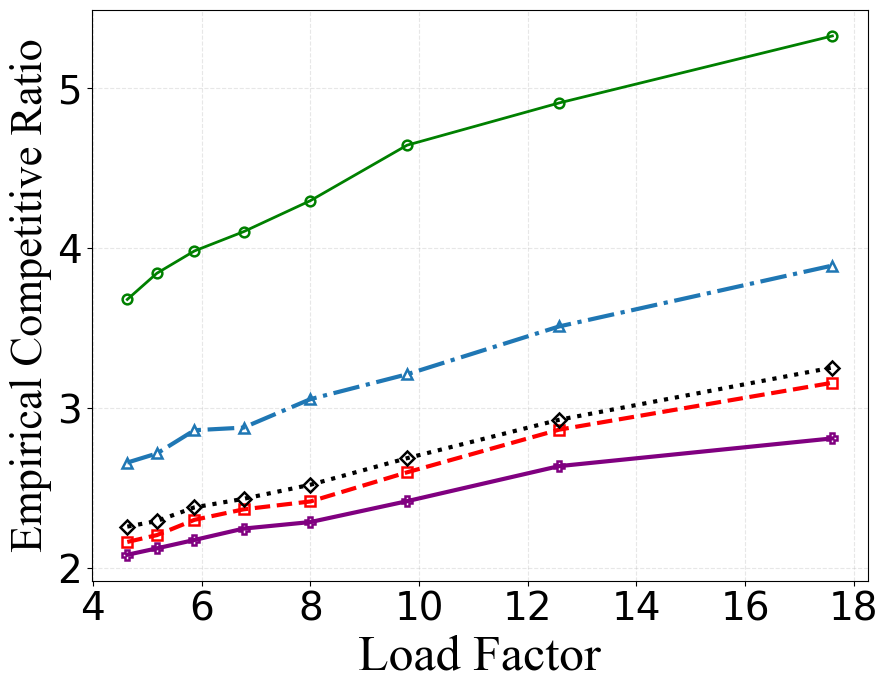

In [19]:
import pandas as pd
import os
import matplotlib.pyplot as plt
value_mode = "stationwise"
offline_csv = f"results/offline_instance_results_{value_mode}_by_loadfactor.csv"
fcfs_csv = f"results/fcfs_instance_results_{value_mode}_by_loadfactor.csv"
myalg_csv = (
    f"results/myalg_beta_eta_grid_instance_results_{value_mode}_by_loadfactor.csv"
)
best_myalg_csv = f"results/best_beta_eta_{value_mode}_by_loadfactor.csv"
theory_myalg_csv = (
    f"results/theory_myalg_instance_results_{value_mode}_by_loadfactor.csv"
)

plot_df, fcfs_avg, myalg_avg, theory_avg = build_avg_cr_vs_loadfactor_tables(
    offline_csv=offline_csv,
    fcfs_csv=fcfs_csv,
    myalg_csv=myalg_csv,
    best_myalg_csv=best_myalg_csv,
    theory_myalg_csv=theory_myalg_csv,
)

plot_df = pd.concat([plot_df, ml_pred_avg, labeled_avg], ignore_index=True)
display(plot_df)

plot_avg_cr_vs_loadfactor(
    plot_df,
    save_path=f"results/avg_cr_vs_loadfactor_all_algs_{value_mode}_v2.pdf",
)

## Build per-instance CR table for one chosen capacity / load factor

In [52]:
def build_instance_cr_cdf_table(
    offline_csv,
    fcfs_csv,
    myalg_csv,
    best_myalg_csv,
    theory_myalg_csv,
    ml_csv=None,
    labeled_csv=None,
    target_total_capacity=None,
    target_load_factor=None,
    tol=1e-8,
):
    def _round_float_cols(df, cols):
        df = df.copy()
        for col in cols:
            df[col] = df[col].astype(float).round(10)
        return df

    def _filter_one_setting(
        df, target_total_capacity=None, target_load_factor=None, tol=1e-8
    ):
        out = df.copy()

        if target_total_capacity is not None:
            out = out[
                np.isclose(
                    out["total_capacity"].astype(float),
                    float(target_total_capacity),
                    atol=tol,
                )
            ].copy()

        if target_load_factor is not None:
            out = out[
                np.isclose(
                    out["load_factor"].astype(float),
                    float(target_load_factor),
                    atol=tol,
                )
            ].copy()

        return out.reset_index(drop=True)

    # -------------------------
    # Read CSVs
    # -------------------------
    offline_df = pd.read_csv(offline_csv)
    fcfs_df = pd.read_csv(fcfs_csv)
    # opa_df = pd.read_csv(opa_csv)
    myalg_df = pd.read_csv(myalg_csv)
    best_df = pd.read_csv(best_myalg_csv)
    theory_df = pd.read_csv(theory_myalg_csv)
    # -------------------------
    # Keep needed columns
    # -------------------------
    offline_df = offline_df[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "offline_utility",
        ]
    ].copy()

    fcfs_df = fcfs_df[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "fcfs_utility",
        ]
    ].copy()

    myalg_df = myalg_df[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "beta",
            "eta",
            "myalg_utility",
        ]
    ].copy()

    best_df = best_df[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "best_beta",
            "best_eta",
        ]
    ].copy()

    theory_df = theory_df[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "beta",
            "eta",
            "theory_myalg_utility",
        ]
    ].copy()

    offline_df = _round_float_cols(
        offline_df, ["total_capacity", "per_station_capacity", "load_factor"]
    )
    fcfs_df = _round_float_cols(
        fcfs_df, ["total_capacity", "per_station_capacity", "load_factor"]
    )

    myalg_df = _round_float_cols(
        myalg_df,
        ["total_capacity", "per_station_capacity", "load_factor", "beta", "eta"],
    )
    best_df = _round_float_cols(
        best_df,
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "best_beta",
            "best_eta",
        ],
    )
    theory_df = _round_float_cols(
        theory_df,
        ["total_capacity", "per_station_capacity", "load_factor", "beta", "eta"],
    )

    # -------------------------
    # Filter to one chosen setting
    # -------------------------
    offline_df = _filter_one_setting(
        offline_df,
        target_total_capacity=target_total_capacity,
        target_load_factor=target_load_factor,
        tol=tol,
    )

    fcfs_df = _filter_one_setting(
        fcfs_df,
        target_total_capacity=target_total_capacity,
        target_load_factor=target_load_factor,
        tol=tol,
    )

    myalg_df = _filter_one_setting(
        myalg_df,
        target_total_capacity=target_total_capacity,
        target_load_factor=target_load_factor,
        tol=tol,
    )

    best_df = _filter_one_setting(
        best_df,
        target_total_capacity=target_total_capacity,
        target_load_factor=target_load_factor,
        tol=tol,
    )
    theory_df = _filter_one_setting(
        theory_df,
        target_total_capacity=target_total_capacity,
        target_load_factor=target_load_factor,
        tol=tol,
    )

    # -------------------------
    # FCFS CR rows
    # -------------------------
    fcfs_merge = fcfs_df.merge(
        offline_df,
        on=["total_capacity", "per_station_capacity", "load_factor", "instance_id"],
        how="inner",
    )

    fcfs_merge["competitive_ratio"] = fcfs_merge.apply(
        lambda r: safe_ratio(r["offline_utility"], r["fcfs_utility"]),
        axis=1,
    )

    fcfs_rows = fcfs_merge[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "competitive_ratio",
        ]
    ].copy()
    fcfs_rows["algorithm"] = "FCFS"
    # -------------------------
    # Theory-MyAlg CR rows
    # -------------------------
    theory_merge = theory_df.merge(
        offline_df,
        on=["total_capacity", "per_station_capacity", "load_factor", "instance_id"],
        how="inner",
    )

    theory_merge["competitive_ratio"] = theory_merge.apply(
        lambda r: safe_ratio(r["offline_utility"], r["theory_myalg_utility"]),
        axis=1,
    )

    theory_rows = theory_merge[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "competitive_ratio",
        ]
    ].copy()
    theory_rows["algorithm"] = "Theory-MyAlg"
    # -------------------------
    # MyAlg(best beta, eta) CR rows
    # -------------------------
    myalg_best = myalg_df.merge(
        best_df,
        left_on=[
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "beta",
            "eta",
        ],
        right_on=[
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "best_beta",
            "best_eta",
        ],
        how="inner",
    )

    myalg_best = myalg_best.merge(
        offline_df,
        on=["total_capacity", "per_station_capacity", "load_factor", "instance_id"],
        how="inner",
    )

    myalg_best["competitive_ratio"] = myalg_best.apply(
        lambda r: safe_ratio(r["offline_utility"], r["myalg_utility"]),
        axis=1,
    )

    myalg_rows = myalg_best[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "competitive_ratio",
        ]
    ].copy()
    myalg_rows["algorithm"] = "MyAlg"

    out_parts = [fcfs_rows, theory_rows, myalg_rows]
    # -------------------------
    # Optional ML_MyAlg CR rows
    # -------------------------
    if ml_csv is not None and os.path.exists(ml_csv):
        ml_df = pd.read_csv(ml_csv)

        ml_df = ml_df[
            [
                "replicate_id",
                "instance_id",
                "total_capacity",
                "load_factor",
                "predicted_param_utility",
            ]
        ].copy()

        ml_df = _round_float_cols(ml_df, ["total_capacity", "load_factor"])

        ml_df = _filter_one_setting(
            ml_df,
            target_total_capacity=target_total_capacity,
            target_load_factor=target_load_factor,
            tol=tol,
        )

        offline_ml = offline_df[
            ["instance_id", "total_capacity", "load_factor", "offline_utility"]
        ].copy()

        ml_merge = ml_df.merge(
            offline_ml,
            on=["instance_id", "total_capacity", "load_factor"],
            how="inner",
        )

        ml_merge["competitive_ratio"] = ml_merge.apply(
            lambda r: safe_ratio(r["offline_utility"], r["predicted_param_utility"]),
            axis=1,
        )

        ml_merge = ml_merge.dropna(subset=["competitive_ratio"]).copy()

        ml_rows = (
            ml_merge.groupby(
                ["total_capacity", "load_factor", "instance_id"],
                as_index=False,
            )
            .agg(competitive_ratio=("competitive_ratio", "mean"))
        )

        ml_rows["per_station_capacity"] = np.nan
        ml_rows["algorithm"] = "ML_MyAlg"

        out_parts.append(ml_rows)
    # -------------------------
    # Optional Label-MyAlg CR rows
    # -------------------------
    if labeled_csv is not None and os.path.exists(labeled_csv):
        labeled_df = pd.read_csv(labeled_csv)

        labeled_df = labeled_df[
            [
                "replicate_id",
                "instance_id",
                "total_capacity",
                "load_factor",
                "labeled_param_utility",
            ]
        ].copy()

        labeled_df = _round_float_cols(labeled_df, ["total_capacity", "load_factor"])

        labeled_df = _filter_one_setting(
            labeled_df,
            target_total_capacity=target_total_capacity,
            target_load_factor=target_load_factor,
            tol=tol,
        )

        offline_labeled = offline_df[
            ["instance_id", "total_capacity", "load_factor", "offline_utility"]
        ].copy()

        labeled_merge = labeled_df.merge(
            offline_labeled,
            on=["instance_id", "total_capacity", "load_factor"],
            how="inner",
        )

        labeled_merge["competitive_ratio"] = labeled_merge.apply(
            lambda r: safe_ratio(r["offline_utility"], r["labeled_param_utility"]),
            axis=1,
        )

        labeled_merge = labeled_merge.dropna(subset=["competitive_ratio"]).copy()

        labeled_rows = (
            labeled_merge.groupby(
                ["total_capacity", "load_factor", "instance_id"],
                as_index=False,
            )
            .agg(competitive_ratio=("competitive_ratio", "mean"))
        )

        labeled_rows["per_station_capacity"] = np.nan
        labeled_rows["algorithm"] = "Label-MyAlg"

        out_parts.append(labeled_rows)

    cdf_df = pd.concat(out_parts, ignore_index=True)
    cdf_df = cdf_df.dropna(subset=["competitive_ratio"]).copy()
    cdf_df = cdf_df.sort_values(
        ["algorithm", "competitive_ratio", "instance_id"]
    ).reset_index(drop=True)

    return cdf_df

## Plot CDF of competitive ratio for one chosen capacity / load factor


In [70]:
def plot_cr_cdf_for_one_setting(
    cdf_df,
    target_total_capacity=None,
    target_load_factor=None,
    save_path=None,
):
    cdf_df = cdf_df.copy()

    name_map = {
        "FCFS": "FCFS",
        "MyAlg": "OPS*",
        "Theory-MyAlg": "OPS",
        "ML_MyAlg": "D-OPS",
        "Label-MyAlg": "D-OPS*",
    }
    cdf_df["algorithm"] = cdf_df["algorithm"].replace(name_map)

    plt.figure(figsize=(9, 7))

    alg_order = ["FCFS", "OPS", "OPS*", "D-OPS", "D-OPS*"]

    style_map = {
        "FCFS": {"marker": "o", "linestyle": "-", "linewidth": 3, "color": "green"},
        "OPS": {
            "marker": "^",
            "linestyle": "-.",
            "linewidth": 3,
            "color": "#1f77b4",
        },
        "OPS*": {"marker": "s", "linestyle": "--", "linewidth": 1.8, "color": "red"},
        "D-OPS": {
            "marker": "D",
            "linestyle": ":",
            "linewidth": 3,
            "color": "black",
        },
        "D-OPS*": {
            "marker": "P",
            "linestyle": "-",
            "linewidth": 3,
            "color": "purple",
        },
    }

    for alg_name in alg_order:
        sub = cdf_df[cdf_df["algorithm"] == alg_name].copy()

        if sub.empty:
            continue

        cr_vals = sub["competitive_ratio"].to_numpy(dtype=float)
        cr_vals = np.maximum(cr_vals, 1.0)  
        x = np.sort(cr_vals)
        y = np.arange(1, len(x) + 1) / float(len(x))

        plt.plot(
            x,
            y,
            label=alg_name,
            marker=style_map[alg_name]["marker"],
            linestyle=style_map[alg_name]["linestyle"],
            linewidth=style_map[alg_name]["linewidth"],
            markersize=4,
            markerfacecolor="none",
            markeredgewidth=2.0,
            color=style_map[alg_name]["color"],
            markevery=max(len(x) // 15, 1),
        )

    plt.xlabel("Empirical Profit Ratio", fontsize=36, fontname="Times New Roman")
    plt.ylabel("CDF", fontsize=32, fontname="Times New Roman")
    plt.grid(True, alpha=0.3, linestyle="--")
    plt.xticks(fontsize=28)
    plt.yticks(fontsize=28)
    # plt.legend(fontsize=20, frameon=True)
    plt.tight_layout()

    if save_path is not None:
        out_dir = os.path.dirname(save_path)
        if out_dir:
            os.makedirs(out_dir, exist_ok=True)
        plt.savefig(save_path, dpi=300, bbox_inches="tight")
        print("Saved plot to:", save_path)

    plt.show()

## CDF of competitive ratio for one chosen capacity / load factor


,total_capacity,per_station_capacity,load_factor,instance_id,competitive_ratio,algorithm
0,1.1,0.366667,8.002159,17,2.136305,FCFS
1,1.1,0.366667,8.002159,3,2.291520,FCFS
2,1.1,0.366667,8.002159,31,2.462575,FCFS
3,1.1,0.366667,8.002159,46,2.493273,FCFS
4,1.1,0.366667,8.002159,4,2.493892,FCFS


,algorithm,p80,p90,p99
0,FCFS,5.104296,5.514967,6.525907
1,D-OPS,2.711483,2.916702,3.384990


Saved plot to: results/cdf_cr_one_setting_stationwise.pdf


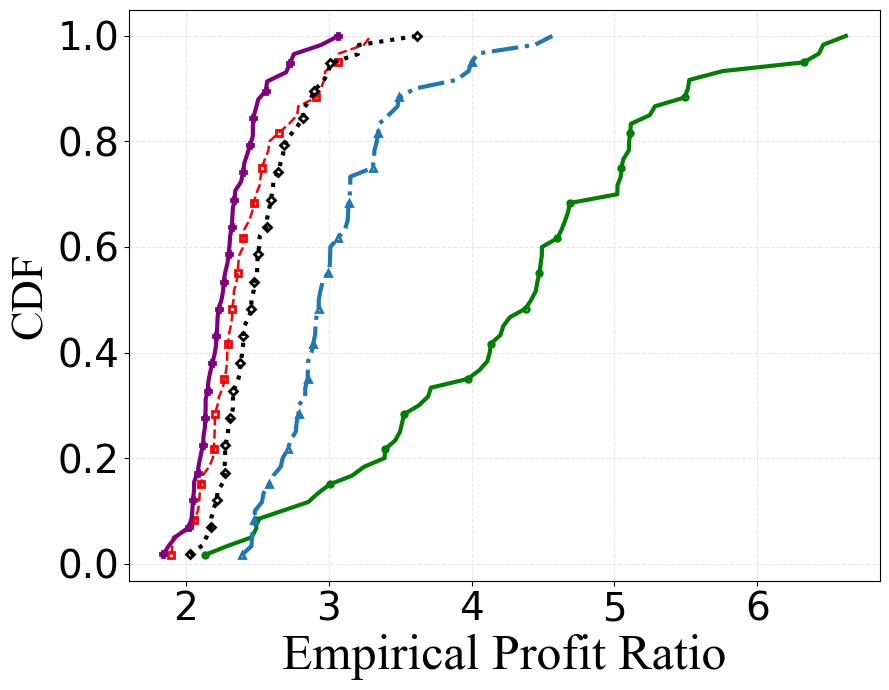

In [72]:
value_mode="stationwise"
offline_csv = f"results/offline_instance_results_{value_mode}_by_loadfactor.csv"
fcfs_csv = f"results/fcfs_instance_results_{value_mode}_by_loadfactor.csv"
myalg_csv = (
    f"results/myalg_beta_eta_grid_instance_results_{value_mode}_by_loadfactor.csv"
)
best_myalg_csv = f"results/best_beta_eta_{value_mode}_by_loadfactor.csv"
theory_myalg_csv = (
    f"results/theory_myalg_instance_results_{value_mode}_by_loadfactor.csv"
)

ml_csv = f"pfinalized/train2019_test2020_scalar_ml_random_pairs_{value_mode}/predicted_param_myalg_test2020_{value_mode}_by_loadfactor.csv"
labeled_csv = f"pfinalized/train2019_test2020_scalar_ml_random_pairs_{value_mode}/labeled_param_myalg_test2020_{value_mode}_by_loadfactor.csv"

# choose one setting
target_total_capacity = None
target_load_factor = 8.0021590101

cdf_df = build_instance_cr_cdf_table(
    offline_csv=offline_csv,
    fcfs_csv=fcfs_csv,
    myalg_csv=myalg_csv,
    best_myalg_csv=best_myalg_csv,
    theory_myalg_csv=theory_myalg_csv,
    ml_csv=ml_csv,
    labeled_csv=labeled_csv,
    target_total_capacity=target_total_capacity,
    target_load_factor=target_load_factor,
)
cdf_df = cdf_df[cdf_df["competitive_ratio"] > 1].copy()

display(cdf_df.head())
name_map = {
    "FCFS": "FCFS",
    "MyAlg": "OPS*",
    "Theory-MyAlg": "OPS",
    "ML_MyAlg": "D-OPS",
    "Label-MyAlg": "D-OPS*",
}

cdf_df["algorithm"] = cdf_df["algorithm"].replace(name_map)
# Compute 80th, 90th, and 99th percentiles for FCFS and SMSP*
percentiles = [0.80, 0.90, 0.99]
algorithms = ["FCFS", "D-OPS"]

results = []

for alg in algorithms:
    sub = cdf_df[cdf_df["algorithm"] == alg].copy()
    cr_vals = sub["competitive_ratio"].dropna().astype(float)

    if len(cr_vals) == 0:
        continue

    q = cr_vals.quantile(percentiles)

    results.append({
        "algorithm": alg,
        "p80": q.loc[0.80],
        "p90": q.loc[0.90],
        "p99": q.loc[0.99],
    })

percentile_df = pd.DataFrame(results)
display(percentile_df)

plot_cr_cdf_for_one_setting(
    cdf_df=cdf_df,
    target_total_capacity=target_total_capacity,
    target_load_factor=target_load_factor,
    save_path=f"results/cdf_cr_one_setting_{value_mode}.pdf",
)

## Cal Avg CR for One LF

In [9]:
import pandas as pd
import numpy as np

def safe_ratio(offline_u, online_u, eps=1e-12):
    if pd.isna(offline_u) or pd.isna(online_u):
        return np.nan
    return float(offline_u) / max(float(online_u), eps)

def compute_avg_profit_ratio_ops_fcfs_at_loadfactor(
    value_mode="stationwise",
    target_load_factor=8.0,
    tol=0.05,
    results_dir="results",
    cr_cap=100,
):
    offline_csv = f"{results_dir}/offline_instance_results_{value_mode}_by_loadfactor.csv"
    fcfs_csv = f"{results_dir}/fcfs_instance_results_{value_mode}_by_loadfactor.csv"
    ops_csv = f"{results_dir}/theory_myalg_instance_results_{value_mode}_by_loadfactor.csv"

    offline_df = pd.read_csv(offline_csv)
    fcfs_df = pd.read_csv(fcfs_csv)
    ops_df = pd.read_csv(ops_csv)

    offline_df = offline_df[
        ["total_capacity", "per_station_capacity", "load_factor", "instance_id", "offline_utility"]
    ].copy()

    fcfs_df = fcfs_df[
        ["total_capacity", "per_station_capacity", "load_factor", "instance_id", "fcfs_utility"]
    ].copy()

    ops_df = ops_df[
        ["total_capacity", "per_station_capacity", "load_factor", "instance_id", "theory_myalg_utility"]
    ].copy()

    for df in [offline_df, fcfs_df, ops_df]:
        for col in ["total_capacity", "per_station_capacity", "load_factor"]:
            df[col] = df[col].astype(float).round(10)

    # keep only rows near target load factor
    offline_df = offline_df[np.isclose(offline_df["load_factor"], target_load_factor, atol=tol)].copy()
    fcfs_df = fcfs_df[np.isclose(fcfs_df["load_factor"], target_load_factor, atol=tol)].copy()
    ops_df = ops_df[np.isclose(ops_df["load_factor"], target_load_factor, atol=tol)].copy()

    # FCFS
    fcfs_merged = fcfs_df.merge(
        offline_df,
        on=["total_capacity", "per_station_capacity", "load_factor", "instance_id"],
        how="inner",
    )
    fcfs_merged["profit_ratio"] = fcfs_merged.apply(
        lambda row: safe_ratio(row["offline_utility"], row["fcfs_utility"]),
        axis=1,
    )
    fcfs_merged = fcfs_merged.dropna(subset=["profit_ratio"]).copy()
    fcfs_merged = fcfs_merged[fcfs_merged["profit_ratio"] <= cr_cap].copy()

    # OPS
    ops_merged = ops_df.merge(
        offline_df,
        on=["total_capacity", "per_station_capacity", "load_factor", "instance_id"],
        how="inner",
    )
    ops_merged["profit_ratio"] = ops_merged.apply(
        lambda row: safe_ratio(row["offline_utility"], row["theory_myalg_utility"]),
        axis=1,
    )
    ops_merged = ops_merged.dropna(subset=["profit_ratio"]).copy()
    ops_merged = ops_merged[ops_merged["profit_ratio"] <= cr_cap].copy()

    summary_df = pd.DataFrame({
        "algorithm": ["FCFS", "OPS"],
        "avg_profit_ratio": [
            fcfs_merged["profit_ratio"].mean(),
            ops_merged["profit_ratio"].mean(),
        ],
        "num_instances": [
            len(fcfs_merged),
            len(ops_merged),
        ],
    })

    return summary_df, fcfs_merged, ops_merged

In [64]:
summary_df, fcfs_detail, ops_detail = compute_avg_profit_ratio_ops_fcfs_at_loadfactor(
    value_mode="stationwise",
    target_load_factor=8.0,
    tol=0.05,   # or 0.01 if you want tighter filtering
    results_dir="results",
)

display(summary_df)

,algorithm,avg_profit_ratio,num_instances
0,FCFS,4.297547,60
1,OPS,3.056565,60


## Avg Acceptance Rate Plot

In [131]:
def compute_instance_sizes(dataloader, number_of_stations, total_capacity_list, time_window, avg_demand):
    rows = []

    for C_total in total_capacity_list:
        base_cap = float(C_total) / float(number_of_stations)
        load_factor = avg_demand / (float(C_total) * float(time_window))

        for instance_id, instance in enumerate(dataloader):
            rows.append(
                {
                    "total_capacity": float(C_total),
                    "per_station_capacity": float(base_cap),
                    "load_factor": float(load_factor),
                    "instance_id": int(instance_id),
                    "num_evs": int(len(instance)),
                }
            )

    return pd.DataFrame(rows)

In [132]:
def _find_first_existing_column(df, candidates, algo_name="algorithm"):
    for col in candidates:
        if col in df.columns:
            return col
    raise ValueError(
        f"Could not find admitted-count column for {algo_name}. "
        f"Tried: {candidates}"
    )

In [133]:
def build_avg_acceptance_vs_loadfactor_tables(
    dataloader,
    number_of_stations,
    total_capacity_list,
    time_window,
    avg_demand,
    fcfs_csv,
    myalg_csv,
    best_myalg_csv,
    theory_myalg_csv=None,
    ml_csv=None,
    labeled_csv=None,
):
    # -------------------------------------------------
    # Build instance-size table from dataloader
    # -------------------------------------------------
    size_df = compute_instance_sizes(
        dataloader=dataloader,
        number_of_stations=number_of_stations,
        total_capacity_list=total_capacity_list,
        time_window=time_window,
        avg_demand=avg_demand,
    )

    for col in ["total_capacity", "per_station_capacity", "load_factor"]:
        size_df[col] = size_df[col].astype(float).round(10)

    # -------------------------------------------------
    # FCFS
    # -------------------------------------------------
    fcfs_df = pd.read_csv(fcfs_csv).copy()
    for col in ["total_capacity", "per_station_capacity", "load_factor"]:
        fcfs_df[col] = fcfs_df[col].astype(float).round(10)

    fcfs_admit_col = _find_first_existing_column(
        fcfs_df,
        ["fcfs_admitted_evs"],
        algo_name="FCFS",
    )

    fcfs_merge = fcfs_df.merge(
        size_df,
        on=["total_capacity", "per_station_capacity", "load_factor", "instance_id"],
        how="inner",
    )

    fcfs_merge["acceptance_rate"] = (
        fcfs_merge[fcfs_admit_col].astype(float) / fcfs_merge["num_evs"].clip(lower=1)
    )

    fcfs_avg = (
        fcfs_merge.groupby(
            ["total_capacity", "per_station_capacity", "load_factor"],
            as_index=False,
        )
        .agg(avg_acceptance_rate=("acceptance_rate", "mean"))
        .sort_values(["total_capacity", "per_station_capacity", "load_factor"])
        .reset_index(drop=True)
    )
    fcfs_avg["algorithm"] = "FCFS"

    # -------------------------------------------------
    # MyAlg (best beta, eta)
    # -------------------------------------------------
    myalg_df = pd.read_csv(myalg_csv).copy()
    best_df = pd.read_csv(best_myalg_csv).copy()

    for col in ["total_capacity", "per_station_capacity", "load_factor", "beta", "eta"]:
        myalg_df[col] = myalg_df[col].astype(float).round(10)

    for col in [
        "total_capacity",
        "per_station_capacity",
        "load_factor",
        "best_beta",
        "best_eta",
    ]:
        best_df[col] = best_df[col].astype(float).round(10)

    myalg_admit_col = _find_first_existing_column(
        myalg_df,
        ["myalg_admitted_evs"],
        algo_name="MyAlg",
    )

    myalg_best = myalg_df.merge(
        best_df,
        left_on=[
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "beta",
            "eta",
        ],
        right_on=[
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "best_beta",
            "best_eta",
        ],
        how="inner",
    )

    myalg_best = myalg_best.merge(
        size_df,
        on=["total_capacity", "per_station_capacity", "load_factor", "instance_id"],
        how="inner",
    )

    myalg_best["acceptance_rate"] = (
        myalg_best[myalg_admit_col].astype(float) / myalg_best["num_evs"].clip(lower=1)
    )

    myalg_avg = (
        myalg_best.groupby(
            ["total_capacity", "per_station_capacity", "load_factor"],
            as_index=False,
        )
        .agg(avg_acceptance_rate=("acceptance_rate", "mean"))
        .sort_values(["total_capacity", "per_station_capacity", "load_factor"])
        .reset_index(drop=True)
    )
    myalg_avg["algorithm"] = "MyAlg"

    # -------------------------------------------------
    # Theory-MyAlg
    # -------------------------------------------------
    theory_avg = pd.DataFrame()
    if theory_myalg_csv is not None and os.path.exists(theory_myalg_csv):
        theory_df = pd.read_csv(theory_myalg_csv).copy()

        for col in ["total_capacity", "per_station_capacity", "load_factor", "beta", "eta"]:
            theory_df[col] = theory_df[col].astype(float).round(10)

        theory_admit_col = _find_first_existing_column(
            theory_df,
            ["theory_myalg_admitted_evs"],
            algo_name="Theory-MyAlg",
        )

        theory_merge = theory_df.merge(
            size_df,
            on=["total_capacity", "per_station_capacity", "load_factor", "instance_id"],
            how="inner",
        )

        theory_merge["acceptance_rate"] = (
            theory_merge[theory_admit_col].astype(float)
            / theory_merge["num_evs"].clip(lower=1)
        )

        theory_avg = (
            theory_merge.groupby(
                ["total_capacity", "per_station_capacity", "load_factor"],
                as_index=False,
            )
            .agg(avg_acceptance_rate=("acceptance_rate", "mean"))
            .sort_values(["total_capacity", "per_station_capacity", "load_factor"])
            .reset_index(drop=True)
        )
        theory_avg["algorithm"] = "Theory-MyAlg"

    # -------------------------------------------------
    # ML_MyAlg
    # -------------------------------------------------
    ml_avg = pd.DataFrame()
    if ml_csv is not None and os.path.exists(ml_csv):
        ml_df = pd.read_csv(ml_csv).copy()

        ml_admit_col = _find_first_existing_column(
            ml_df,
            [
                "predicted_param_admitted_evs",
                "ml_admitted_evs",
                "admitted_evs",
            ],
            algo_name="ML_MyAlg",
        )

        for col in ["total_capacity", "load_factor"]:
            ml_df[col] = ml_df[col].astype(float).round(10)

        size_ml = size_df[
            ["instance_id", "total_capacity", "load_factor", "num_evs"]
        ].copy()

        ml_merge = ml_df.merge(
            size_ml,
            on=["instance_id", "total_capacity", "load_factor"],
            how="inner",
        )

        ml_merge["acceptance_rate"] = (
            ml_merge[ml_admit_col].astype(float) / ml_merge["num_evs"].clip(lower=1)
        )

        ml_avg = (
            ml_merge.groupby(["total_capacity", "load_factor"], as_index=False)
            .agg(avg_acceptance_rate=("acceptance_rate", "mean"))
            .sort_values(["total_capacity", "load_factor"])
            .reset_index(drop=True)
        )
        ml_avg["per_station_capacity"] = np.nan
        ml_avg["algorithm"] = "ML_MyAlg"

    # -------------------------------------------------
    # Label-MyAlg
    # -------------------------------------------------
    labeled_avg = pd.DataFrame()
    if labeled_csv is not None and os.path.exists(labeled_csv):
        labeled_df = pd.read_csv(labeled_csv).copy()

        labeled_admit_col = _find_first_existing_column(
            labeled_df,
            [
                "labeled_param_admitted_evs",
                "label_admitted_evs",
                "admitted_evs",
            ],
            algo_name="Label-MyAlg",
        )

        for col in ["total_capacity", "load_factor"]:
            labeled_df[col] = labeled_df[col].astype(float).round(10)

        size_labeled = size_df[
            ["instance_id", "total_capacity", "load_factor", "num_evs"]
        ].copy()

        labeled_merge = labeled_df.merge(
            size_labeled,
            on=["instance_id", "total_capacity", "load_factor"],
            how="inner",
        )

        labeled_merge["acceptance_rate"] = (
            labeled_merge[labeled_admit_col].astype(float)
            / labeled_merge["num_evs"].clip(lower=1)
        )

        labeled_avg = (
            labeled_merge.groupby(["total_capacity", "load_factor"], as_index=False)
            .agg(avg_acceptance_rate=("acceptance_rate", "mean"))
            .sort_values(["total_capacity", "load_factor"])
            .reset_index(drop=True)
        )
        labeled_avg["per_station_capacity"] = np.nan
        labeled_avg["algorithm"] = "Label-MyAlg"

    # -------------------------------------------------
    # Combine
    # -------------------------------------------------
    plot_parts = [fcfs_avg, myalg_avg]
    if not theory_avg.empty:
        plot_parts.append(theory_avg)
    if not ml_avg.empty:
        plot_parts.append(ml_avg)
    if not labeled_avg.empty:
        plot_parts.append(labeled_avg)

    plot_df = pd.concat(plot_parts, ignore_index=True)
    plot_df = plot_df.sort_values(
        ["algorithm", "total_capacity", "per_station_capacity", "load_factor"]
    ).reset_index(drop=True)

    return plot_df, fcfs_avg, myalg_avg, theory_avg, ml_avg, labeled_avg

In [134]:
def plot_avg_acceptance_vs_loadfactor(plot_df, save_path=None):
    plot_df = plot_df.copy()
    plot_df["load_factor"] = plot_df["load_factor"].astype(float).round(10)

    name_map = {
        "FCFS": "FCFS",
        "MyAlg": "SMSP*",
        "Theory-MyAlg": "SMSP",
        "ML_MyAlg": "Predictive-SMSP",
        "Label-MyAlg": "Label-SMSP*",
    }
    plot_df["algorithm"] = plot_df["algorithm"].replace(name_map)

    plot_ready = plot_df.sort_values(["algorithm", "load_factor"]).reset_index(drop=True)

    plt.figure(figsize=(9, 5.5))

    alg_order = ["FCFS", "SMSP", "SMSP*", "Predictive-SMSP", "Label-SMSP*"]
    style_map = {
        "FCFS": {"marker": "o", "linestyle": "-", "linewidth": 2, "color": "green"},
        "SMSP": {
            "marker": "^",
            "linestyle": "-.",
            "linewidth": 2,
            "color": "#1f77b4",
        },
        "SMSP*": {
            "marker": "s",
            "linestyle": "--",
            "linewidth": 2,
            "color": "red",
        },
        "Predictive-SMSP": {
            "marker": "D",
            "linestyle": ":",
            "linewidth": 2.2,
            "color": "black",
        },
        "Label-SMSP*": {
            "marker": "P",
            "linestyle": "-",
            "linewidth": 2.2,
            "color": "purple",
        },
    }

    for alg_name in alg_order:
        sub = plot_ready[plot_ready["algorithm"] == alg_name]
        if sub.empty:
            continue

        plt.plot(
            sub["load_factor"],
            sub["avg_acceptance_rate"],
            label=alg_name,
            marker=style_map[alg_name]["marker"],
            linestyle=style_map[alg_name]["linestyle"],
            linewidth=style_map[alg_name]["linewidth"],
            markersize=7,
            markerfacecolor="none",
            markeredgewidth=1.8,
            color=style_map[alg_name]["color"],
        )

    plt.xlabel("Load Factor", fontsize=30, fontname="Times New Roman")
    plt.ylabel("Acceptance Rate", fontsize=30, fontname="Times New Roman")
    plt.grid(True, alpha=0.3, linestyle="--")
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.legend(fontsize=17, frameon=True, loc="best")
    plt.tight_layout()

    if save_path is not None:
        out_dir = os.path.dirname(save_path)
        if out_dir:
            os.makedirs(out_dir, exist_ok=True)
        plt.savefig(save_path, dpi=300, bbox_inches="tight")
        print("Saved plot to:", save_path)

    plt.show()

,total_capacity,per_station_capacity,load_factor,avg_acceptance_rate,algorithm
0,0.5,0.166667,17.604750,0.111567,FCFS
1,0.7,0.233333,12.574821,0.141534,FCFS
2,0.9,0.300000,9.780417,0.169705,FCFS
3,1.1,0.366667,8.002159,0.192852,FCFS
4,1.3,0.433333,6.771058,0.213856,FCFS
5,1.5,0.500000,5.868250,0.237141,FCFS
6,1.7,0.566667,5.177868,0.254069,FCFS
7,1.9,0.633333,4.632829,0.268995,FCFS
8,0.5,NaN,17.604750,0.126440,Label-MyAlg
9,0.7,NaN,12.574821,0.163680,Label-MyAlg


Saved plot to: results/avg_acceptance_vs_loadfactor_all_algs_stationwise.pdf


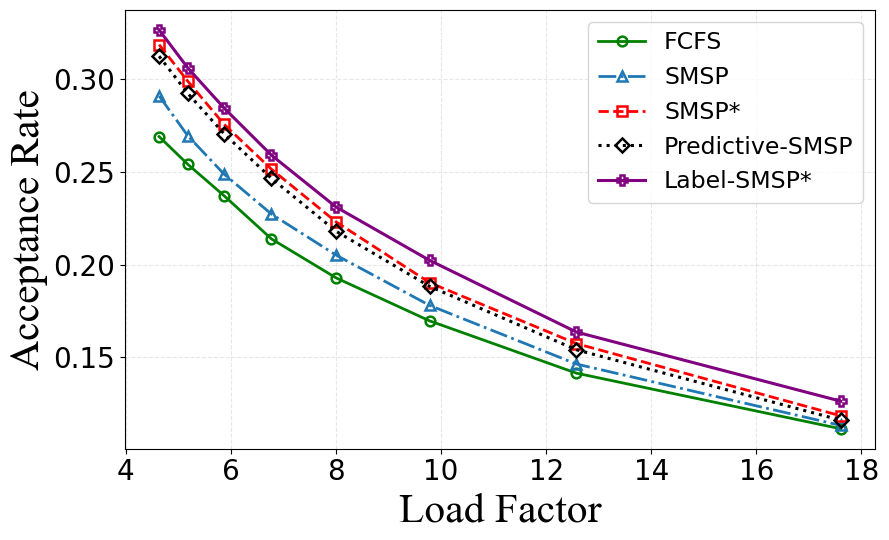

In [135]:
offline_csv = f"results/offline_instance_results_{value_mode}_by_loadfactor.csv"
fcfs_csv = f"results/fcfs_instance_results_{value_mode}_by_loadfactor.csv"
myalg_csv = f"results/myalg_beta_eta_grid_instance_results_{value_mode}_by_loadfactor.csv"
best_myalg_csv = f"results/best_beta_eta_{value_mode}_by_loadfactor.csv"
theory_myalg_csv = f"results/theory_myalg_instance_results_{value_mode}_by_loadfactor.csv"

ml_csv = f"pfinalized/train2019_test2020_scalar_ml_random_pairs_{value_mode}/predicted_param_myalg_test2020_{value_mode}_by_loadfactor.csv"
labeled_csv = f"pfinalized/train2019_test2020_scalar_ml_random_pairs_{value_mode}/labeled_param_myalg_test2020_{value_mode}_by_loadfactor.csv"

avg_demand = compute_avg_instance_demand(dataloader)
total_capacity_list = np.arange(0.5, 2.0, 0.2).tolist()

accept_plot_df, fcfs_acc, myalg_acc, theory_acc, ml_acc, labeled_acc = (
    build_avg_acceptance_vs_loadfactor_tables(
        dataloader=dataloader,
        number_of_stations=number_of_stations,
        total_capacity_list=total_capacity_list,
        time_window=time_window,
        avg_demand=avg_demand,
        fcfs_csv=fcfs_csv,
        myalg_csv=myalg_csv,
        best_myalg_csv=best_myalg_csv,
        theory_myalg_csv=theory_myalg_csv,
        ml_csv=ml_csv,
        labeled_csv=labeled_csv,
    )
)

display(accept_plot_df)

plot_avg_acceptance_vs_loadfactor(
    accept_plot_df,
    save_path=f"results/avg_acceptance_vs_loadfactor_all_algs_{value_mode}.pdf",
)